In this case study,we use risk analytics to analyse Bank Dataset on loans and we use EDA to analyse the patterns present in the data to identify various factors that can be helpful in minimizing the risk of loosing money while lending to customers.
Types of analysis done are:
1.Missing Value Treatment.
2.Treatment of outliers.
3.Imbalance in the Target variable column.
4.univariate, segmented univariate, bivariate analysis.
5.statistical correlation.

Two data sets were provided as part of this case study:
1.Application Data
2.Previous application data
In order to perform data quality checks and handling missing values,we have considered Application data set and performed necessary acions.

In [1]:
# importing packages
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings('ignore')
from IPython.display import display
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.options.display.float_format = '{:.2f}'.format

In [3]:
# Load the two dataset here
#loading application data
app_data = pd.read_csv('application_data.csv')
app_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.00,406597.50,24700.50,351000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.02,-9461,-637,-3648.00,-2120,NaN,1,1,0,1,1,0,Laborers,1.00,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.08,0.26,0.14,0.02,0.04,0.97,0.62,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,0.03,0.04,0.97,0.63,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,0.03,0.04,0.97,0.62,0.01,0.00,0.07,0.08,0.12,0.04,0.02,0.02,0.00,0.00,reg oper account,block of flats,0.01,"Stone, brick",No,2.00,2.00,2.00,2.00,-1134.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.00,1.00
1,100003,0,Cash loans,F,N,N,0,270000.00,1293502.50,35698.50,1129500.00,Family,State servant,Higher education,Married,House / apartment,0.00,-16765,-1188,-1186.00,-291,NaN,1,1,0,1,1,0,Core staff,2.00,1,1,MONDAY,11,0,0,0,0,0,0,School,0.31,0.62,NaN,0.10,0.05,0.99,0.80,0.06,0.08,0.03,0.29,0.33,0.01,0.08,0.05,0.00,0.01,0.09,0.05,0.99,0.80,0.05,0.08,0.03,0.29,0.33,0.01,0.08,0.06,0.00,0.00,0.10,0.05,0.99,0.80,0.06,0.08,0.03,0.29,0.33,0.01,0.08,0.06,0.00,0.01,reg oper account,block of flats,0.07,Block,No,1.00,0.00,1.00,0.00,-828.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.00,0.00,0.00,0.00
2,100004,0,Revolving loans,M,Y,Y,0,67500.00,135000.00,6750.00,135000.00,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.01,-19046,-225,-4260.00,-2531,26.00,1,1,1,1,1,0,Laborers,1.00,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.56,0.73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.00,-815.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.00,0.00,0.0

In [4]:
# loading the previous application data here
prev_appli = pd.read_csv('previous_application.csv')
prev_appli.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.43,17145.00,17145.00,0.00,17145.00,SATURDAY,15,Y,1,0.00,0.18,0.87,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.00,middle,POS mobile with interest,365243.00,-42.00,300.00,-42.00,-37.00,0.00
1,2802425,108129,Cash loans,25188.62,607500.00,679671.00,NaN,607500.00,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.00,low_action,Cash X-Sell: low,365243.00,-134.00,916.00,365243.00,365243.00,1.00
2,2523466,122040,Cash loans,15060.74,112500.00,136444.50,NaN,112500.00,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,high,Cash X-Sell: high,365243.00,-271.00,59.00,365243.00,365243.00,1.00
3,2819243,176158,Cash loans,47041.33,450000.00,470790.00,NaN,450000.00,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.00,middle,Cash X-Sell: middle,365243.00,-482.00,-152.00,-182.00,-177.00,1.00
4,1784265,202054,Cash loans,31924.40,337500.00,404055.00,NaN,337500.00,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.00,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
app_data.shape

(307511, 122)

In [6]:
prev_appli.shape

(1670214, 37)

In [7]:
app_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [8]:
prev_appli.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [9]:
app_data.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.00,307511.00,307511.00,307511.00,307511.00,307499.00,307233.00,307511.00,307511.00,307511.00,307511.00,307511.00,104582.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307509.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,134133.00,306851.00,246546.00,151450.00,127568.00,157504.00,103023.00,92646.00,143620.00,152683.00,154491.00,98869.00,124921.00,97312.00,153161.00,93997.00,137829.00,151450.00,127568.00,157504.00,103023.00,92646.00,143620.00,152683.00,154491.00,98869.00,124921.00,97312.00,153161.00,93997.00,137829.00,151450.00,127568.00,157504.00,103023.00,92646.00,143620.00,152683.00,154491.00,98869.00,124921.00,97312.00,153161.00,93997.00,137829.00,159080.00,306490.00,306490.00,306490.00,306490.00,307510.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,265992.00,265992.00,265992.00,265992.00,265992.00,265992.00
mean,278180.52,0.08,0.42,168797.92,599026.00,27108.57,538396.21,0.02,-16037.00,63815.05,-4986.12,-2994.20,12.06,1.00,0.82,0.20,1.00,0.28,0.06,2.15,2.05,2.03,12.06,0.02,0.05,0.04,0.08,0.23,0.18,0.50,0.51,0.51,0.12,0.09,0.98,0.75,0.04,0.08,0.15,0.23,0.23,0.07,0.10,0.11,0.01,0.03,0.11,0.09,0.98,0.76,0.04,0.07,0.15,0.22,0.23,0.06,0.11,0.11,0.01,0.03,0.12,0.09,0.98,0.76,0.04,0.08,0.15,0.23,0.23,0.07,0.10,0.11,0.01,0.03,0.10,1.42,0.14,1.41,0.10,-962.86,0.00,0.71,0.00,0.02,0.09,0.00,0.08,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.01,0.00,0.00,0.00,0.01,0.01,0.03,0.27,0.27,1.90
std,102790.18,0.27,0.72,237123.15,402490.78,14493.74,369446.46,0.01,4363.99,141275.77,3522.89,1509.45,11.94,0.00,0.38,0.40,0.04,0.45,0.23,0.91,0.51,0.50,3.27,0.12,0.22,0.20,0.27,0.42,0.38,0.21,0.19,0.19,0.11,0.08,0.06,0.11,0.08,0.13,0.10,0.14,0.16,0.08,0.09,0.11,0.05,0.07,0.11,0.08,0.06,0.11,0.07,0.13,0.10,0.14,0.16,0.08,0.10,0.11,0.05,0.07,0.11,0.08,0.06,0.11,0.08,0.13,0.10,0.15,0.16,0.08,0.09,0.11,0.05,0.07,0.11,2.40,0.45,2.38,0.36,826.81,0.

INSIGHT:
There are 122 columns and 307511 rows.
There columns having negative, postive values which includes days. fixing is required.

In [10]:
prev_appli.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1670214.00,1670214.00,1297979.00,1670214.00,1670213.00,774370.00,1284699.00,1670214.00,1670214.00,774370.00,5951.00,5951.00,1670214.00,1670214.00,1297984.00,997149.00,997149.00,997149.00,997149.00,997149.00,997149.00
mean,1923089.14,278357.17,15955.12,175233.86,196114.02,6697.40,227847.28,12.48,1.00,0.08,0.19,0.77,-880.68,313.95,16.05,342209.86,13826.27,33767.77,76582.40,81992.34,0.33
std,532597.96,102814.82,14782.14,292779.76,318574.62,20921.50,315396.56,3.33,0.06,0.11,0.09,0.10,779.10,7127.44,14.57,88916.12,72444.87,106857.03,149647.42,153303.52,0.47
min,1000001.00,100001.00,0.00,0.00,0.00,-0.90,0.00,0.00,0.00,-0.00,0.03,0.37,-2922.00,-1.00,0.00,-2922.00,-2892.00,-2801.00,-2889.00,-2874.00,0.00
25%,1461857.25,189329.00,6321.78,18720.00,24160.50,0.00,50841.00,10.00,1.00,0.00,0.16,0.72,-1300.00,-1.00,6.00,365243.00,-1628.00,-1242.00,-1314.00,-1270.00,0.00
50%,1923110.50,278714.50,11250.00,71046.00,80541.00,1638.00,112320.00,12.00,1.00,0.05,0.19,0.84,-581.00,3.00,12.00,365243.00,-831.00,-361.00,-537.00,-499.00,0.00
75%,2384279.75,367514.00,20658.42,180360.00,216418.50,7740.00,234000.00,15.00,1.00,0.11,0.19,0.85,-280.00,82.00,24.00,365243.00,-411.00,129.00,-74.00,-44.00,1.00
max,2845382.00,456255.00,418058.15,6905160.00,6905160.00,3060045.00,6905160.00,23.00,1.00,1.00,1.00,1.00,-1.00,4000000.00,84.00,365243.00,365243.00,365243.00,365243.00,365243.00,1.00


In [11]:
#checking data type of each column
app_data.dtypes

SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OWN_CAR_AGE                     float64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64


There are 122 columns having various data types like object, int, float and 305711 rows.

## EXPLANATORY DATA ANALYSIS

## PART A- Missing Value Treatment

We have observed there were many missing values in this data set, so using the indexing and count of missing values in each column, identified the % of missing values for each column.

In [12]:
# percentage missing values (column-wise) in the application data
round(100*(app_data.isnull().sum() / len(app_data.index)), 2)

SK_ID_CURR                      0.00
TARGET                          0.00
NAME_CONTRACT_TYPE              0.00
CODE_GENDER                     0.00
FLAG_OWN_CAR                    0.00
FLAG_OWN_REALTY                 0.00
CNT_CHILDREN                    0.00
AMT_INCOME_TOTAL                0.00
AMT_CREDIT                      0.00
AMT_ANNUITY                     0.00
AMT_GOODS_PRICE                 0.09
NAME_TYPE_SUITE                 0.42
NAME_INCOME_TYPE                0.00
NAME_EDUCATION_TYPE             0.00
NAME_FAMILY_STATUS              0.00
NAME_HOUSING_TYPE               0.00
REGION_POPULATION_RELATIVE      0.00
DAYS_BIRTH                      0.00
DAYS_EMPLOYED                   0.00
DAYS_REGISTRATION               0.00
DAYS_ID_PUBLISH                 0.00
OWN_CAR_AGE                    65.99
FLAG_MOBIL                      0.00
FLAG_EMP_PHONE                  0.00
FLAG_WORK_PHONE                 0.00
FLAG_CONT_MOBILE                0.00
FLAG_PHONE                      0.00
F

There are quite a few variables in the dataset which has missing values. The share of missing values varies a lot across these variables. We are going to reject those variables where the missing values are more than 15% percent. For the remaining variables with missing values less than 15% will be considered and treated accordingly.

In [13]:
#dropping all the columns which has missing value more than 15%
application_df = app_data.drop(app_data.columns[app_data.isnull().mean() >= 0.15], axis = 1)
app_data.shape

(307511, 122)

In [14]:
application_df.shape

(307511, 71)

 we now have variables where the percentage share of missing values by columns are less than 15%.

In [15]:
# percentage missing values (column-wise) after dropping columns which had more than 15% missing values
round(100*(application_df.isnull().sum() / len(application_df.index)), 2)

SK_ID_CURR                     0.00
TARGET                         0.00
NAME_CONTRACT_TYPE             0.00
CODE_GENDER                    0.00
FLAG_OWN_CAR                   0.00
FLAG_OWN_REALTY                0.00
CNT_CHILDREN                   0.00
AMT_INCOME_TOTAL               0.00
AMT_CREDIT                     0.00
AMT_ANNUITY                    0.00
AMT_GOODS_PRICE                0.09
NAME_TYPE_SUITE                0.42
NAME_INCOME_TYPE               0.00
NAME_EDUCATION_TYPE            0.00
NAME_FAMILY_STATUS             0.00
NAME_HOUSING_TYPE              0.00
REGION_POPULATION_RELATIVE     0.00
DAYS_BIRTH                     0.00
DAYS_EMPLOYED                  0.00
DAYS_REGISTRATION              0.00
DAYS_ID_PUBLISH                0.00
FLAG_MOBIL                     0.00
FLAG_EMP_PHONE                 0.00
FLAG_WORK_PHONE                0.00
FLAG_CONT_MOBILE               0.00
FLAG_PHONE                     0.00
FLAG_EMAIL                     0.00
CNT_FAM_MEMBERS             

We are dropping a few more selected columns which we believe may not be important for our analysis.

In [16]:
#list of columns to be dropped as these columns have no significant value for the analysis
lst_col = ['FLAG_MOBIL','FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6',
       'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12',
       'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18',
       'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'NAME_TYPE_SUITE']

In [17]:
#dropping the above columns
application_df = application_df.drop(lst_col, axis = 1)
application_df.shape

(307511, 40)

In [18]:
# list of columns in the application dataset
print(application_df.columns)
print(application_df.dtypes.value_counts())

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'DAYS_LAST_PHONE_CHANGE',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_B

In [19]:
application_df['CODE_GENDER'].unique()

array(['M', 'F', 'XNA'], dtype=object)

In [20]:
# CODE_GENDER ['M' 'F' 'XNA']. removing rows which has value XNA
application_df = application_df.loc[application_df['CODE_GENDER'] != 'XNA']
application_df.shape

(307507, 40)

## PART B- Treatment of outliers

Here in our analysis to nd out the outliers, we have considered few numerical columnsand analyzed the stascs of them.

In [21]:
application_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.00,406597.50,24700.50,351000.00,Working,Secondary / secondary special,Single / not married,House / apartment,0.02,-9461,-637,-3648.00,-2120,1.00,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.26,-1134.00,0.00,0.00,0.00,0.00,0.00,1.00
1,100003,0,Cash loans,F,N,N,0,270000.00,1293502.50,35698.50,1129500.00,State servant,Higher education,Married,House / apartment,0.00,-16765,-1188,-1186.00,-291,2.00,1,1,MONDAY,11,0,0,0,0,0,0,School,0.62,-828.00,0.00,0.00,0.00,0.00,0.00,0.00
2,100004,0,Revolving loans,M,Y,Y,0,67500.00,135000.00,6750.00,135000.00,Working,Secondary / secondary special,Single / not married,House / apartment,0.01,-19046,-225,-4260.00,-2531,1.00,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.56,-815.00,0.00,0.00,0.00,0.00,0.00,0.00
3,100006,0,Cash loans,F,N,Y,0,135000.00,312682.50,29686.50,297000.00,Working,Secondary / secondary special,Civil marriage,House / apartment,0.01,-19005,-3039,-9833.00,-2437,2.00,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.65,-617.00,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.00,513000.00,21865.50,513000.00,Working,Secondary / secondary special,Single / not married,House / apartment,0.03,-19932,-3038,-4311.00,-3458,1.00,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.32,-1106.00,0.00,0.00,0.00,0.00,0.00,0.00


In [22]:
round(application_df[['AMT_GOODS_PRICE', 'EXT_SOURCE_2','AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY']].describe(), 2)

,AMT_GOODS_PRICE,EXT_SOURCE_2,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY
count,307229.00,306847.00,307507.00,307507.00,307495.00
mean,538397.72,0.51,168797.69,599028.60,27108.67
std,369447.25,0.19,237124.63,402492.60,14493.80
min,40500.00,0.00,25650.00,45000.00,1615.50
25%,238500.00,0.39,112500.00,270000.00,16524.00
50%,450000.00,0.57,147150.00,513531.00,24903.00
75%,679500.00,0.66,202500.00,808650.00,34596.00
max,4050000.00,0.85,117000000.00,4050000.00,258025.50


We can see the the percentile value of EXT_SOURCE_2 is gradually increasing and thus we can conclude that there is no outliers like that in the AMT_GOODS_PRICE variable. Therefore, we can impute the missing values of the EXT_SOURCE_2 column with its mean and we drop the missing value rows of AMT_GOODS_PRICE.

In [23]:
# imputing EXT_SOURCE_2 by its mean value
application_df.loc[np.isnan(application_df['EXT_SOURCE_2']), ['EXT_SOURCE_2']] = application_df['EXT_SOURCE_2'].mean()

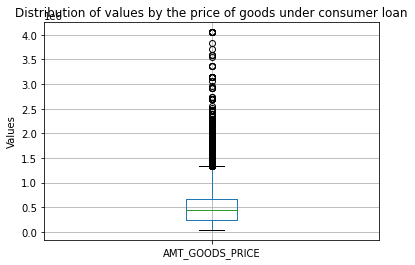

In [24]:
#plotting AMT_GOODS_PRICE to show outliers
ax = application_df.boxplot(column='AMT_GOODS_PRICE')
plt.title('Distribution of values by the price of goods under consumer loan')
#ax.set_xlabel('Price of Goods')
ax.set_ylabel('Values')
plt.show()

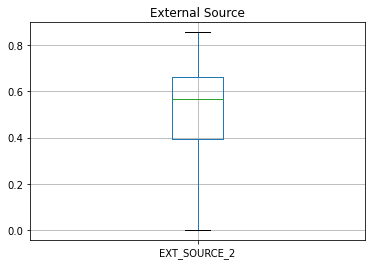

In [25]:
#plotting EXT_SOURCE_2 to show outliers
ax = application_df.boxplot(column='EXT_SOURCE_2')
plt.title('External Source')
plt.show()

In [26]:
#dropping the rows which contain AMT_GOODS_PRICE NaN values
application_df = application_df[~np.isnan(application_df['AMT_GOODS_PRICE'])]

In [27]:
# remove the rows where the values from multiple columns related to Credit Bureau information is null
col = ['AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']
application_df = application_df.dropna(axis=0, subset= col)

We  drop some columns related to the number of enquery with Credit Bureau. We keep AMT_REQ_CREDIT_BUREAU_YEAR to find the number of enquery per yearly basis and drop other coulmns.

The data type of the columns are appropriate. So, we are not changing the data type of any column.

In [28]:
#calculating the percentage of retained rows
round((application_df.shape[0] / app_data.shape[0])*100,2)

86.42

We have retained 86.4% rows after cleaning the data for our analysis so far.

In [29]:
application_df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.00,406597.50,24700.50,351000.00,Working,Secondary / secondary special,Single / not married,House / apartment,0.02,-9461,-637,-3648.00,-2120,1.00,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.26,-1134.00,0.00,0.00,0.00,0.00,0.00,1.00
1,100003,0,Cash loans,F,N,N,0,270000.00,1293502.50,35698.50,1129500.00,State servant,Higher education,Married,House / apartment,0.00,-16765,-1188,-1186.00,-291,2.00,1,1,MONDAY,11,0,0,0,0,0,0,School,0.62,-828.00,0.00,0.00,0.00,0.00,0.00,0.00
2,100004,0,Revolving loans,M,Y,Y,0,67500.00,135000.00,6750.00,135000.00,Working,Secondary / secondary special,Single / not married,House / apartment,0.01,-19046,-225,-4260.00,-2531,1.00,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.56,-815.00,0.00,0.00,0.00,0.00,0.00,0.00
4,100007,0,Cash loans,M,N,Y,0,121500.00,513000.00,21865.50,513000.00,Working,Secondary / secondary special,Single / not married,House / apartment,0.03,-19932,-3038,-4311.00,-3458,1.00,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.32,-1106.00,0.00,0.00,0.00,0.00,0.00,0.00
5,100008,0,Cash loans,M,N,Y,0,99000.00,490495.50,27517.50,454500.00,State servant,Secondary / secondary special,Married,House / apartment,0.04,-16941,-1588,-4970.00,-477,2.00,2,2,WEDNESDAY,16,0,0,0,0,0,0,Other,0.35,-2536.00,0.00,0.00,0.00,0.00,1.00,1.00


In [30]:
# another set of continuous variables
round(application_df[['AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE','DAYS_BIRTH']].describe(percentiles = [0.05, 0.25, 0.5, 0.75, 0.9, 0.95, .99]))

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,DAYS_BIRTH
count,265756.00,265756.00,265745.00,265756.00,265756.00
mean,171309.00,606600.00,27186.00,545040.00,-16117.00
std,248481.00,404836.00,14388.00,371445.00,4309.00
min,26100.00,45000.00,1616.00,40500.00,-25201.00
5%,67500.00,142200.00,9000.00,135000.00,-23198.00
25%,112500.00,272520.00,16636.00,238500.00,-19715.00
50%,157500.00,521280.00,24988.00,450000.00,-15813.00
75%,202500.00,813195.00,34749.00,684000.00,-12569.00
90%,270000.00,1157958.00,45954.00,1125000.00,-10427.00
95%,337500.00,1350000.00,53253.00,1327500.00,-9619.00


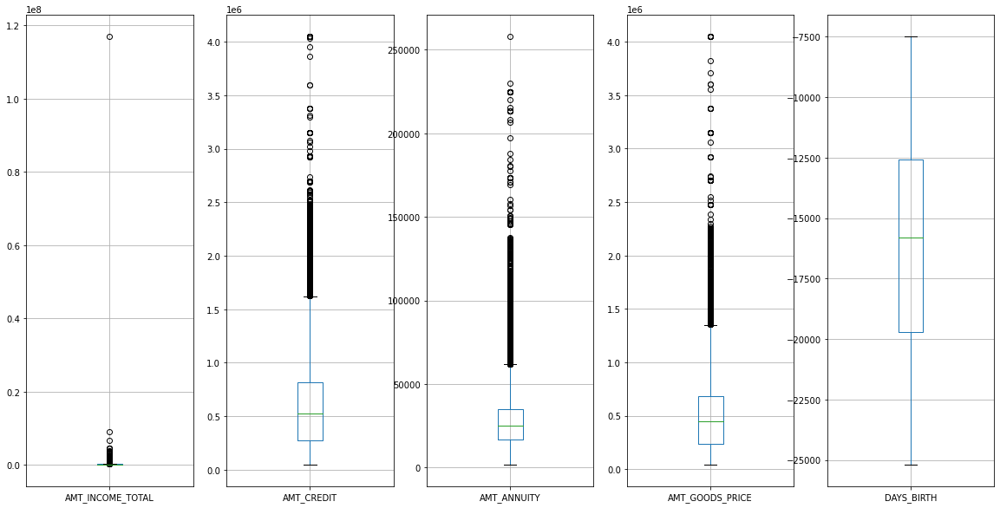

In [31]:
cols = ['AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE','DAYS_BIRTH']
plt.figure(figsize=(20,10))
for i, col in enumerate(cols):
    plt.subplot(1,5, i+1)
    application_df.boxplot(column = col)
plt.show()

We observe that AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE variables have huge outliers as we can see the spike at 100 percentile. So we will use 1.5 IQR rule to remove outliers

In [32]:
# removing outliers using 1.5 IQR method
for col in cols: 
    q1 = application_df[col].quantile(0.25)
    q3 = application_df[col].quantile(0.75)
    iqr = q3-q1
    range_low  = q1-1.5*iqr
    range_high = q3+1.5*iqr
    application_df = application_df.loc[(application_df[col] > range_low) & (application_df[col] < range_high)]

In [33]:
# percentage data lost 
100 * ((app_data.shape[0] - application_df.shape[0]) / app_data.shape[0])

22.582931992676684

Almost 23% of the total rows lost for data cleaning compared to the raw dataset

## Binning Numerical Columns to create a Categorical column

In [34]:
#Binning AMT_INCOME_TOTAL , AMT_CREDIT, AMT_GOODS_PRICE, DAYS_BIRTH, DAYS_EMPLOYED

# Creating bins for income amount in term of Lakhs
application_df['AMT_INCOME_TOTAL']=application_df['AMT_INCOME_TOTAL']/100000

bins = [0,1,2,3,4,5,6,7,8,9,10,11]
slot = ['0-1L','1L-2L', '2L-3L','3L-4L','4L-5L','5L-6L','6L-7L','7L-8L','8L-9L','9L-10L','10L Above']

application_df['AMT_INCOME_RANGE']=pd.cut(application_df['AMT_INCOME_TOTAL'],bins,labels=slot)

In [35]:
round((application_df["AMT_INCOME_RANGE"].value_counts(normalize = True)*100),2)

1L-2L       54.56
0-1L        21.78
2L-3L       21.57
3L-4L        2.09
4L-5L        0.00
5L-6L        0.00
6L-7L        0.00
7L-8L        0.00
8L-9L        0.00
9L-10L       0.00
10L Above    0.00
Name: AMT_INCOME_RANGE, dtype: float64

In [36]:
# Creating bins for Credit amount in term of Lakhs
application_df['AMT_CREDIT']=application_df['AMT_CREDIT']/100000

bins = [0,1,2,3,4,5,6,7,8,9,10,100]
slots = ['0-1L','1L-2L', '2L-3L','3L-4L','4L-5L','5L-6L','6L-7L','7L-8L','8L-9L','9L-10L','10L Above']

application_df['AMT_CREDIT_RANGE']=pd.cut(application_df['AMT_CREDIT'],bins=bins,labels=slots)

In [37]:
round((application_df["AMT_CREDIT_RANGE"].value_counts(normalize = True)*100),2)

2L-3L       19.30
5L-6L       11.92
10L Above   11.31
4L-5L       11.10
1L-2L       10.32
3L-4L        9.29
6L-7L        8.29
8L-9L        7.38
7L-8L        6.12
9L-10L       2.84
0-1L         2.12
Name: AMT_CREDIT_RANGE, dtype: float64

In [38]:
# Creating bins for Price of Goods in term of Lakhs
application_df['AMT_GOODS_PRICE']=application_df['AMT_GOODS_PRICE']/100000

bins = [0,1,2,3,4,5,6,7,8,9,10,100]
slots = ['0-1L','1L-2L', '2L-3L','3L-4L','4L-5L','5L-6L','6L-7L','7L-8L','8L-9L','9L-10L','10L Above']

application_df['AMT_GOODS_PRICE_RANGE']=pd.cut(application_df['AMT_GOODS_PRICE'],bins=bins,labels=slots)

In [39]:
round((application_df["AMT_GOODS_PRICE_RANGE"].value_counts(normalize = True)*100),2)

2L-3L       22.16
4L-5L       19.85
6L-7L       13.46
1L-2L       11.33
3L-4L        7.47
8L-9L        6.80
10L Above    6.05
5L-6L        4.53
0-1L         3.06
7L-8L        2.71
9L-10L       2.58
Name: AMT_GOODS_PRICE_RANGE, dtype: float64

In [40]:
# creating "days_col" varibale to store all days columns
days_col = ["DAYS_BIRTH", "DAYS_EMPLOYED"]

application_df[days_col].describe()

,DAYS_BIRTH,DAYS_EMPLOYED
count,238066.00,238066.00
mean,-16121.67,66574.21
std,4370.47,143562.49
min,-25201.00,-17912.00
25%,-19798.00,-2773.00
50%,-15805.00,-1211.00
75%,-12486.00,-269.00
max,-7489.00,365243.00


from above we get to know that days are in negative which is not usual, so to correct it we use absolute function.

In [41]:
#using abs() function to correct the days values

application_df[days_col]= abs(application_df[days_col])

In [42]:
application_df[days_col].describe()

,DAYS_BIRTH,DAYS_EMPLOYED
count,238066.00,238066.00
mean,16121.67,70501.23
std,4370.47,141675.29
min,7489.00,0.00
25%,12486.00,956.00
50%,15805.00,2284.00
75%,19798.00,6158.75
max,25201.00,365243.00


In [43]:
application_df["AGE"] = application_df["DAYS_BIRTH"]//365
bins = [0,20,25,30,35,40,45,50,55,60,100]
slots = ["0-20","20-25","25-30","30-35","35-40","40-45","45-50","50-55","55-60","60 Above"]

application_df["AGE_GROUP"] = pd.cut(application_df["AGE"], bins=bins, labels=slots)

In [44]:
application_df["AGE_GROUP"].value_counts(normalize= True)*100

35-40      14.25
40-45      12.95
30-35      12.88
25-30      11.78
50-55      11.35
45-50      10.99
55-60      10.94
60 Above   10.02
20-25       4.83
0-20        0.00
Name: AGE_GROUP, dtype: float64

In [45]:
#creating column "EMPLOYEMENT_YEARS" from "DAYS_EMPLOYED"

application_df["YEARS_EMPLOYED"] = application_df["DAYS_EMPLOYED"]/365
bins = [0,5,10,15,20,25,30,50]
slots = ["0-5","5-10","10-15","15-20","20-25","25-30","30 Above"]

application_df["EMPLOYEMENT_YEARS"] = pd.cut(application_df["YEARS_EMPLOYED"], bins=bins, labels=slots)

In [46]:
application_df["EMPLOYEMENT_YEARS"].value_counts(normalize= True)*100

0-5        53.50
5-10       25.89
10-15      11.05
15-20       4.32
20-25       2.56
25-30       1.42
30 Above    1.25
Name: EMPLOYEMENT_YEARS, dtype: float64

In [47]:
application_df.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AGE,YEARS_EMPLOYED
count,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00,238066.00
mean,278153.67,0.08,0.42,1.52,5.35,24584.80,4.77,0.02,16121.67,70501.23,-5028.76,-3051.34,2.15,2.08,2.06,12.02,0.01,0.04,0.03,0.08,0.23,0.18,0.51,-976.30,0.01,0.01,0.03,0.25,0.26,1.91,43.67,193.15
std,102835.99,0.27,0.72,0.61,3.19,11134.36,2.85,0.01,4370.47,141675.29,3533.54,1487.10,0.91,0.49,0.48,3.23,0.11,0.20,0.18,0.26,0.42,0.38,0.19,827.37,0.08,0.11,0.20,0.88,0.61,1.87,11.97,388.15
min,100002.00,0.00,0.00,0.26,0.45,1615.50,0.41,0.00,7489.00,0.00,-24672.00,-7197.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-4185.00,0.00,0.00,0.00,0.00,0.00,0.00,20.00,0.00
25%,188958.25,0.00,0.00,1.12,2.70,15966.00,2.29,0.01,12486.00,956.00,-7532.00,-4318.00,2.00,2.00,2.00,10.00,0.00,0.00,0.00,0.00,0.00,0.00,0.39,-1589.00,0.00,0.00,0.00,0.00,0.00,0.00,34.00,2.62
50%,278107.50,0.00,0.00,1.35,4.81,23683.50,4.50,0.02,15805.00,2284.00,-4547.00,-3339.00,2.00,2.00,2.00,12.00,0.00,0.00,0.00,0.00,0.00,0.00,0.56,-784.00,0.00,0.00,0.00,0.00,0.00,1.00,43.00,6.26
75%,367125.25,0.00,1.00,1.84,7.55,31630.50,6.75,0.03,19798.00,6158.75,-2055.00,-1820.00,3.00,2.00,2.00,14.00,0.00,0.00,0.00,0.00,0.00,0.00,0.66,-278.00,0.00,0.00,0.00,0.00,0.00,3.00,54.00,16.87
max,456255.00,1.00,19.00,3.37,15.98,57577.50,13.41,0.07,25201.00,365243.00,0.00,0.00,20.00,3.00,3.00,23.00,1.00,1.00,1.00,1.00,1.00,1.00,0.85,0.00,4.00,9.00,8.00,24.00,19.00,25.00,69.00,1000.67


## PART C: Imbalance in the Target variable column

In [48]:
# The ratio of the applicants with no payment difficulties (Target = 0) and with payment difficulties (Target = 1)
100*application_df['TARGET'].value_counts(normalize = True)

0   91.98
1    8.02
Name: TARGET, dtype: float64

While working with the data frame based on Target variable, we can clearly see the imbalance between target type 1 and 0
Ratio of imbalance is 91.98 : 8.02

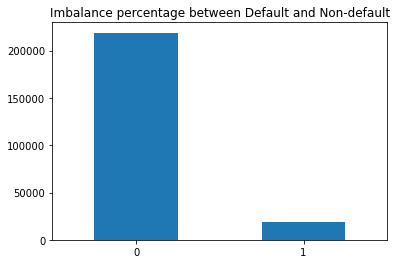

In [49]:
# graphical analysis of the share
application_df['TARGET'].value_counts().plot(kind='bar')
plt.title('Imbalance percentage between Default and Non-default')
plt.xticks(rotation = 0)
plt.show()

There is a large imbalance between the proportion of default (TARGET = 1) and non-default (TARGET = 0) in the dataset. The ratio of non-deafult to default is 11.4:1. Even if the default ratio is low, default of any application is costly and should be analyzed closely.

we Divide the dataset into two subsets based on Target variable. i.e. Target=0 and Target=1

In [50]:
#creating dataframe with TARGET = 1 (payment defaulted)
app_target_default = application_df.loc[application_df['TARGET'] == 1]
print(app_target_default.shape)
display(app_target_default.head())

(19094, 47)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_INCOME_RANGE,AMT_CREDIT_RANGE,AMT_GOODS_PRICE_RANGE,AGE,AGE_GROUP,YEARS_EMPLOYED,EMPLOYEMENT_YEARS
0,100002,1,Cash loans,M,N,Y,0,2.02,4.07,24700.50,3.51,Working,Secondary / secondary special,Single / not married,House / apartment,0.02,9461,637,-3648.00,-2120,1.00,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.26,-1134.00,0.00,0.00,0.00,0.00,0.00,1.00,2L-3L,4L-5L,3L-4L,25,20-25,1.75,0-5
26,100031,1,Cash loans,F,N,Y,0,1.12,9.80,27076.50,7.02,Working,Secondary / secondary special,Widow,House / apartment,0.02,18724,2628,-6573.00,-1827,1.00,3,2,MONDAY,9,0,0,0,0,0,0,Business Entity Type 3,0.55,-161.00,0.00,0.00,0.00,0.00,2.00,2.00,1L-2L,9L-10L,7L-8L,51,50-55,7.20,5-10
40,100047,1,Cash loans,M,N,Y,0,2.02,11.94,35028.00,8.55,Commercial associate,Secondary / secondary special,Married,House / apartment,0.03,17482,1262,-1182.00,-1029,2.00,2,2,TUESDAY,9,0,0,0,0,0,0,Business Entity Type 3,0.31,-1075.00,0.00,0.00,0.00,2.00,0.00,4.00,2L-3L,10L Above,8L-9L,47,45-50,3.46,0-5
42,100049,1,Cash loans,F,N,N,0,1.35,2.89,16258.50,2.38,Working,Secondary / secondary special,Civil marriage,House / apartment,0.01,13384,3597,-45.00,-4409,2.00,3,3,THURSDAY,11,0,0,0,0,0,0,Self-employed,0.67,-1480.00,0.00,0.00,0.00,0.00,0.00,2.00,1L-2L,2L-3L,2L-3L,36,35-40,9.85,5-10
81,100096,1,Cash loans,F,N,Y,0,0.81,2.52,14593.50,2.52,Pensioner,Secondary / secondary special,Married,House / apartment,0.03,24794,365243,-5391.00,-4199,2.00,2,2,THURSDAY,10,0,0,0,0,0,0,XNA,0.02,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0-1L,2L-3L,2L-3L,67,60 Above,1000.67,NaN


In [51]:
#creating dataframe with TARGET = 0 (payment not defaulted)
app_target_nondefault = application_df.loc[application_df['TARGET'] == 0]
print(app_target_nondefault.shape)
display(app_target_nondefault.head())

(218972, 47)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_INCOME_RANGE,AMT_CREDIT_RANGE,AMT_GOODS_PRICE_RANGE,AGE,AGE_GROUP,YEARS_EMPLOYED,EMPLOYEMENT_YEARS
1,100003,0,Cash loans,F,N,N,0,2.70,12.94,35698.50,11.29,State servant,Higher education,Married,House / apartment,0.00,16765,1188,-1186.00,-291,2.00,1,1,MONDAY,11,0,0,0,0,0,0,School,0.62,-828.00,0.00,0.00,0.00,0.00,0.00,0.00,2L-3L,10L Above,10L Above,45,40-45,3.25,0-5
2,100004,0,Revolving loans,M,Y,Y,0,0.68,1.35,6750.00,1.35,Working,Secondary / secondary special,Single / not married,House / apartment,0.01,19046,225,-4260.00,-2531,1.00,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.56,-815.00,0.00,0.00,0.00,0.00,0.00,0.00,0-1L,1L-2L,1L-2L,52,50-55,0.62,0-5
4,100007,0,Cash loans,M,N,Y,0,1.22,5.13,21865.50,5.13,Working,Secondary / secondary special,Single / not married,House / apartment,0.03,19932,3038,-4311.00,-3458,1.00,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.32,-1106.00,0.00,0.00,0.00,0.00,0.00,0.00,1L-2L,5L-6L,5L-6L,54,50-55,8.32,5-10
5,100008,0,Cash loans,M,N,Y,0,0.99,4.90,27517.50,4.54,State servant,Secondary / secondary special,Married,House / apartment,0.04,16941,1588,-4970.00,-477,2.00,2,2,WEDNESDAY,16,0,0,0,0,0,0,Other,0.35,-2536.00,0.00,0.00,0.00,0.00,1.00,1.00,0-1L,4L-5L,4L-5L,46,45-50,4.35,0-5
8,100011,0,Cash loans,F,N,Y,0,1.12,10.20,33826.50,9.13,Pensioner,Secondary / secondary special,Married,House / apartment,0.02,20099,365243,-7427.00,-3514,2.00,2,2,WEDNESDAY,14,0,0,0,0,0,0,XNA,0.21,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1L-2L,10L Above,9L-10L,55,50-55,1000.67,NaN


## Graphical Analysis

1.Graphical analysis of categorical columns

In order to perform Univariate analyis on categorical variables available in the data set for both 0 and 1, we have choosen few columns in terms of variable and compared against total number of rows in data frame and based on Target variable.

In [52]:
app_target_default.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'DAYS_LAST_PHONE_CHANGE',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_B

1.Contract Type

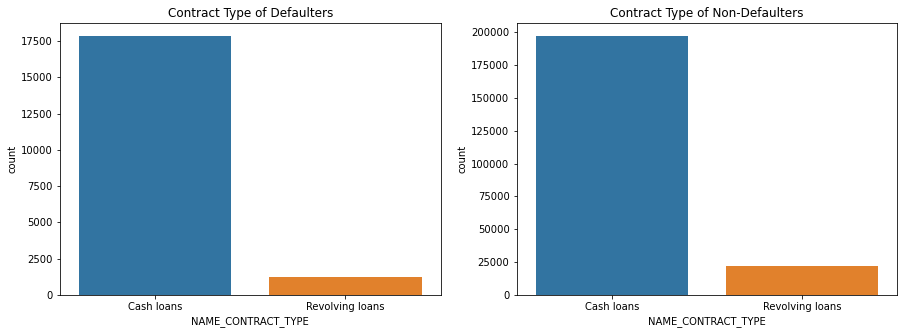

In [53]:
# plotting based on 'NAME_CONTRACT_TYPE' counts
plt.figure(figsize = (15,5))

plt.subplot(1,2,1)
sns.countplot(x = 'NAME_CONTRACT_TYPE', data = app_target_default)
plt.title('Contract Type of Defaulters')

plt.subplot(1,2,2)
sns.countplot(x = 'NAME_CONTRACT_TYPE', data = app_target_nondefault)
plt.title('Contract Type of Non-Defaulters')

plt.show()

From above we see that the Number of Cash loans are higher in both default/ non-default cases than Revolving loans.

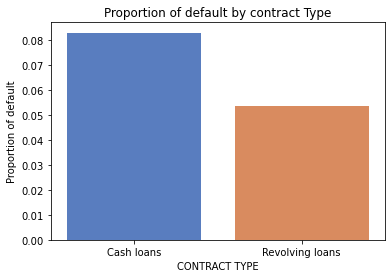

In [54]:
# proportion of non-default
c = pd.DataFrame(application_df.groupby(['NAME_CONTRACT_TYPE'])['TARGET'].value_counts()/application_df.groupby(['NAME_CONTRACT_TYPE'])['TARGET'].count())
c.columns = ['Per_Target']
target = pd.pivot_table(c, values ='Per_Target', index =['NAME_CONTRACT_TYPE'],columns =['TARGET'], aggfunc = np.sum) 
target = target.reset_index()
target.drop(0, axis = 1, inplace = True)
target.columns = ['NAME_CONTRACT_TYPE','Non-default']
ax2 = sns.barplot(x='NAME_CONTRACT_TYPE', y= 'Non-default',palette="muted", data= target)
ax2.set_xlabel('CONTRACT TYPE')
ax2.set_ylabel('Proportion of default')
ax2.set_title('Proportion of default by contract Type')
plt.show()

The above fig shows that the proportion of default is higher in cash loan category compared to the revolving loans.

2.Gender

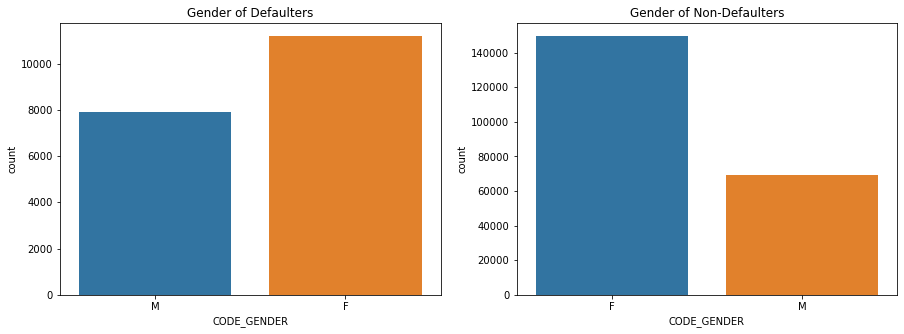

In [55]:
# plotting based on 'CODE_GENDER' counts
plt.figure(figsize = (15,5))

plt.subplot(1,2,1)
sns.countplot(x = 'CODE_GENDER', data = app_target_default)
plt.title('Gender of Defaulters')

plt.subplot(1,2,2)
sns.countplot(x = 'CODE_GENDER', data = app_target_nondefault)
plt.title('Gender of Non-Defaulters')

plt.show()

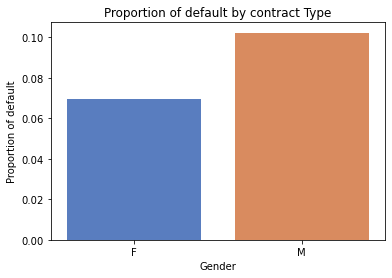

In [56]:
# proportion of non-default
c = pd.DataFrame(application_df.groupby(['CODE_GENDER'])['TARGET'].value_counts()/application_df.groupby(['CODE_GENDER'])['TARGET'].count())
c.columns = ['Per_Target']
target = pd.pivot_table(c, values ='Per_Target', index =['CODE_GENDER'],columns =['TARGET'], aggfunc = np.sum) 
target = target.reset_index()
target.drop(0, axis = 1, inplace = True)
target.columns = ['CODE_GENDER','Non-default']
ax2 = sns.barplot(x='CODE_GENDER', y= 'Non-default',palette="muted", data= target)
ax2.set_xlabel('Gender')
ax2.set_ylabel('Proportion of default')
ax2.set_title('Proportion of default by contract Type')
plt.show()

Number of Female clients are more in both the cases default/non-default. And the proportion of default is lower among female applicants than that of the male.

3.Car Ownership Status

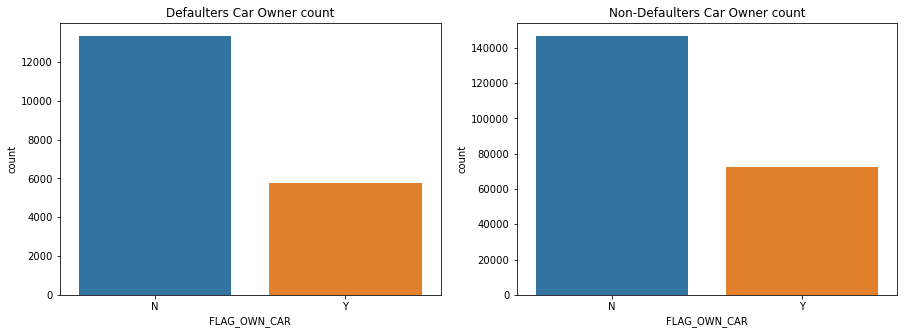

In [57]:
# plotting based on 'FLAG_OWN_CAR' counts
plt.figure(figsize = (15,5))

plt.subplot(1,2,1)
sns.countplot(x = 'FLAG_OWN_CAR', data = app_target_default)
plt.title('Defaulters Car Owner count')

plt.subplot(1,2,2)
sns.countplot(x = 'FLAG_OWN_CAR', data = app_target_nondefault)
plt.title('Non-Defaulters Car Owner count')

plt.show()

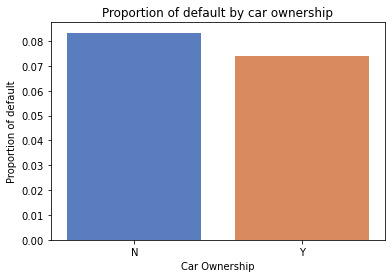

In [58]:
# proportion of non-default
c = pd.DataFrame(application_df.groupby(['FLAG_OWN_CAR'])['TARGET'].value_counts()/application_df.groupby(['FLAG_OWN_CAR'])['TARGET'].count())
c.columns = ['Per_Target']
target = pd.pivot_table(c, values ='Per_Target', index =['FLAG_OWN_CAR'],columns =['TARGET'], aggfunc = np.sum) 
target = target.reset_index()
target.drop(0, axis = 1, inplace = True)
target.columns = ['FLAG_OWN_CAR','Non-default']
ax2 = sns.barplot(x='FLAG_OWN_CAR', y= 'Non-default',palette="muted", data= target)
ax2.set_xlabel('Car Ownership')
ax2.set_ylabel('Proportion of default')
ax2.set_title('Proportion of default by car ownership')
plt.show()

we can see that in both Defalut/Non-default cases, the count of client who do not own car is higher than who owns a car. The proportion of default is higher for non-car owners relative to the car owners.

 4.Income Type

In [59]:
display(pd.DataFrame(app_target_default['NAME_INCOME_TYPE'].value_counts()))
display(pd.DataFrame(app_target_nondefault['NAME_INCOME_TYPE'].value_counts()))

,NAME_INCOME_TYPE
Working,11838
Commercial associate,3924
Pensioner,2338
State servant,994


,NAME_INCOME_TYPE
Working,113560
Commercial associate,47279
Pensioner,42339
State servant,15774
Student,13
Unemployed,4
Businessman,2
Maternity leave,1


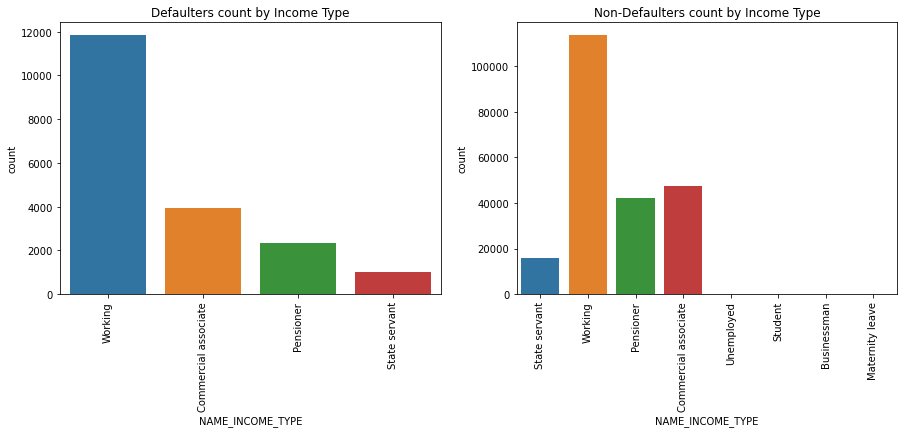

In [60]:
# plotting based on 'NAME_INCOME_TYPE' counts
plt.figure(figsize = (15,5))

plt.subplot(1,2,1)
sns.countplot(x = 'NAME_INCOME_TYPE', data = app_target_default)
plt.xticks(rotation = 90)
plt.title('Defaulters count by Income Type')

plt.subplot(1,2,2)
sns.countplot(x = 'NAME_INCOME_TYPE', data = app_target_nondefault)
plt.xticks(rotation = 90)
plt.title('Non-Defaulters count by Income Type')

plt.show()

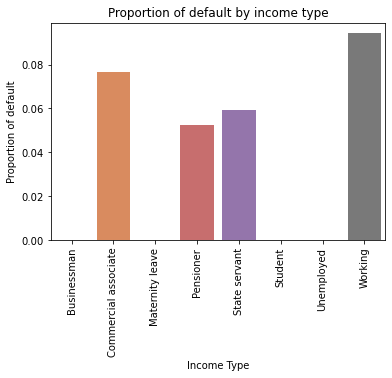

In [61]:
# proportion of non-default
c = pd.DataFrame(application_df.groupby(['NAME_INCOME_TYPE'])['TARGET'].value_counts()/application_df.groupby(['NAME_INCOME_TYPE'])['TARGET'].count())
c.columns = ['Per_Target']
target = pd.pivot_table(c, values ='Per_Target', index =['NAME_INCOME_TYPE'],columns =['TARGET'], aggfunc = np.sum) 
target = target.reset_index()
target.drop(0, axis = 1, inplace = True)
target.columns = ['NAME_INCOME_TYPE','Non-default']
ax2 = sns.barplot(x='NAME_INCOME_TYPE', y= 'Non-default',palette="muted", data= target)
ax2.set_xlabel('Income Type')
ax2.set_ylabel('Proportion of default')
ax2.set_title('Proportion of default by income type')
plt.xticks(rotation = 90)
plt.show()

Majority of the applicants are from working, commercial associate, pensioners and state servants. The remaining categories of income types are very small. The proportion of default is high among the working and the commercial associates. It is relatively lower for the pensioner and state servant.

5.Realty Ownership Status

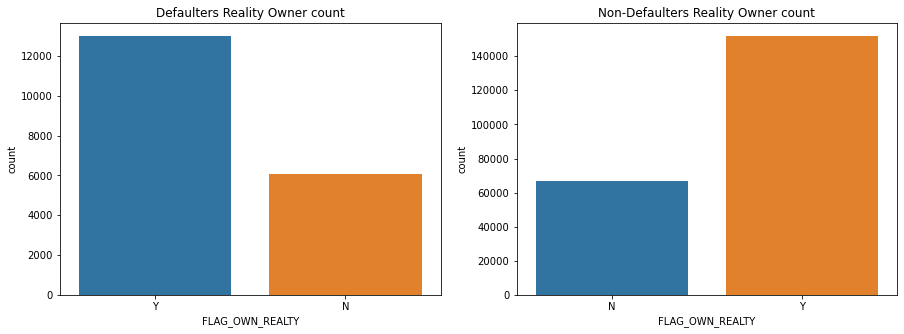

In [62]:
# plotting based on 'FLAG_OWN_REALTY' counts
plt.figure(figsize = (15,5))

plt.subplot(1,2,1)
sns.countplot(x = 'FLAG_OWN_REALTY', data = app_target_default)
plt.title('Defaulters Reality Owner count')

plt.subplot(1,2,2)
sns.countplot(x = 'FLAG_OWN_REALTY', data = app_target_nondefault)
plt.title('Non-Defaulters Reality Owner count')

plt.show()


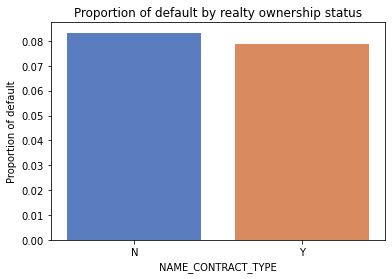

In [63]:
# proportion of non-default
c = pd.DataFrame(application_df.groupby(['FLAG_OWN_REALTY'])['TARGET'].value_counts()/application_df.groupby(['FLAG_OWN_REALTY'])['TARGET'].count())
c.columns = ['Per_Target']
target = pd.pivot_table(c, values ='Per_Target', index =['FLAG_OWN_REALTY'],columns =['TARGET'], aggfunc = np.sum) 
target = target.reset_index()
target.drop(0, axis = 1, inplace = True)
target.columns = ['FLAG_OWN_REALTY','Non-default']
ax2 = sns.barplot(x='FLAG_OWN_REALTY', y= 'Non-default',palette="muted", data= target)
ax2.set_xlabel('NAME_CONTRACT_TYPE')
ax2.set_ylabel('Proportion of default')
ax2.set_title('Proportion of default by realty ownership status')
plt.show()

Defalut/Non-default both the cases, the count of client who do own real estate is higher than who has not. Applicants with no realty ownership has a higher propensity to default than the clients who own real estate.

6.Education Type

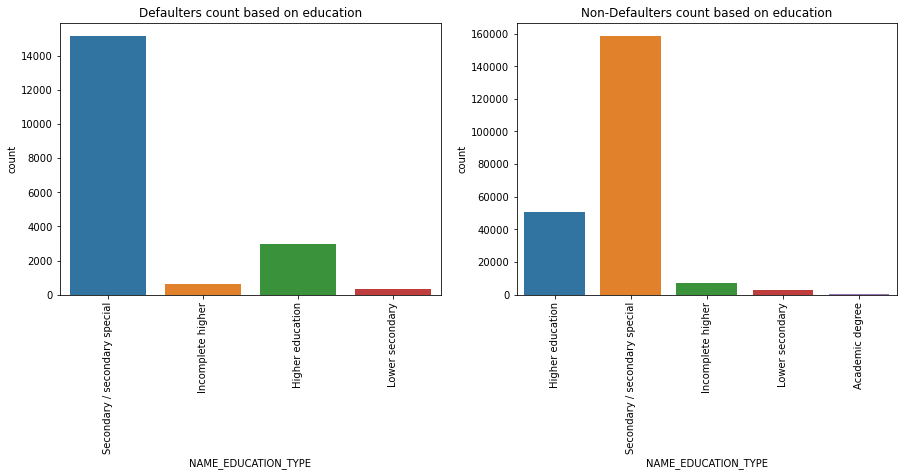

In [64]:
# plotting based on 'NAME_EDUCATION_TYPE' counts
plt.figure(figsize = (15,5))

plt.subplot(1,2,1)
sns.countplot(x = 'NAME_EDUCATION_TYPE', data = app_target_default)
plt.xticks(rotation = 90)
plt.title('Defaulters count based on education')

plt.subplot(1,2,2)
sns.countplot(x = 'NAME_EDUCATION_TYPE', data = app_target_nondefault)
plt.xticks(rotation = 90)
plt.title('Non-Defaulters count based on education')

plt.show()

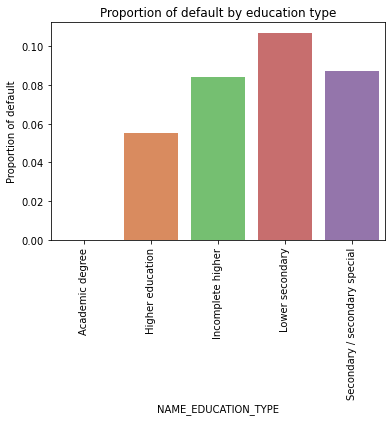

In [65]:
# proportion of non-default
c = pd.DataFrame(application_df.groupby(['NAME_EDUCATION_TYPE'])['TARGET'].value_counts()/application_df.groupby(['NAME_EDUCATION_TYPE'])['TARGET'].count())
c.columns = ['Per_Target']
target = pd.pivot_table(c, values ='Per_Target', index =['NAME_EDUCATION_TYPE'],columns =['TARGET'], aggfunc = np.sum) 
target = target.reset_index()
target.drop(0, axis = 1, inplace = True)
target.columns = ['NAME_EDUCATION_TYPE','Non-default']
ax2 = sns.barplot(x='NAME_EDUCATION_TYPE', y= 'Non-default',palette="muted", data= target)
ax2.set_xlabel('NAME_EDUCATION_TYPE')
ax2.set_ylabel('Proportion of default')
ax2.set_title('Proportion of default by education type')
plt.xticks(rotation = 90)
plt.show()

Applicants with secondary and higher secondary education are among the highest defaulters as well as not defaulters. Whereas, applicants with academic degrees are the smallest group of applicants that have applied for the loan and applicants from this background has no recorded of default. From the above figure, we see that a distinct pattern emerges. The chances of default is lower as the education level of the applicants increases.

7.Family Status

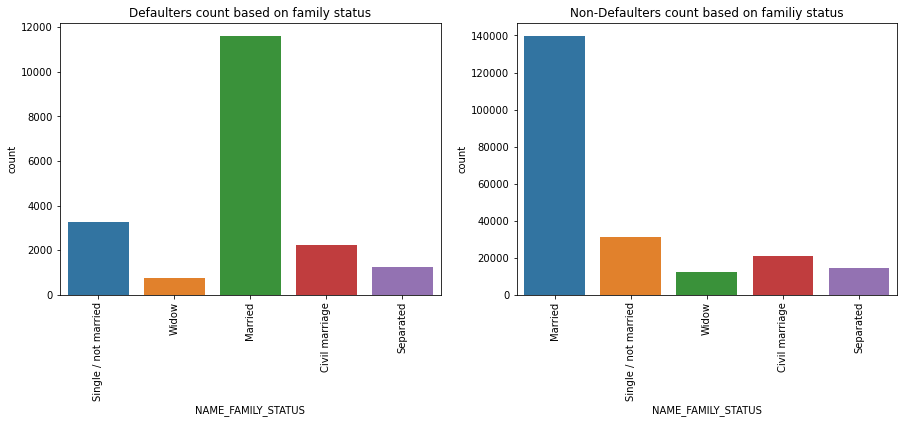

In [66]:
# plotting based on 'NAME_FAMILY_STATUS' counts
plt.figure(figsize = (15,5))

plt.subplot(1,2,1)
sns.countplot(x = 'NAME_FAMILY_STATUS', data = app_target_default)
plt.xticks(rotation = 90)
plt.title('Defaulters count based on family status')

plt.subplot(1,2,2)
sns.countplot(x = 'NAME_FAMILY_STATUS', data = app_target_nondefault)
plt.xticks(rotation = 90)
plt.title('Non-Defaulters count based on familiy status')

plt.show()

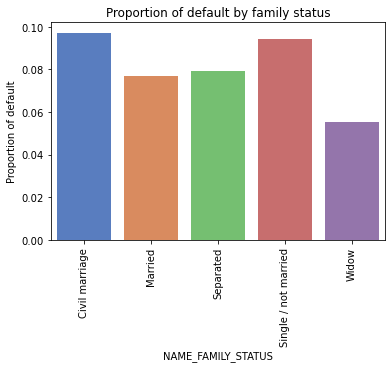

In [67]:
# proportion of non-default
c = pd.DataFrame(application_df.groupby(['NAME_FAMILY_STATUS'])['TARGET'].value_counts()/application_df.groupby(['NAME_FAMILY_STATUS'])['TARGET'].count())
c.columns = ['Per_Target']
target = pd.pivot_table(c, values ='Per_Target', index =['NAME_FAMILY_STATUS'],columns =['TARGET'], aggfunc = np.sum) 
target = target.reset_index()
target.drop(0, axis = 1, inplace = True)
target.columns = ['NAME_FAMILY_STATUS','Non-default']
ax2 = sns.barplot(x='NAME_FAMILY_STATUS', y= 'Non-default',palette="muted", data= target)
ax2.set_xlabel('NAME_FAMILY_STATUS')
ax2.set_ylabel('Proportion of default')
ax2.set_title('Proportion of default by family status')
plt.xticks(rotation = 90)
plt.show()

Applicants who are married are among the highest number of defaulters and non-defaulters. Whereas, widows are the lowest number of defaulters and non-defaulters. The proportion of default is the highest among the applicants who are in civil marriage category followed by applicants who are single.

8.Spatial Effect

In [68]:
col = ['SK_ID_CURR', 'TARGET','LIVE_REGION_NOT_WORK_REGION','LIVE_CITY_NOT_WORK_CITY']
livework_df = application_df[col]
livework_df.head()

,SK_ID_CURR,TARGET,LIVE_REGION_NOT_WORK_REGION,LIVE_CITY_NOT_WORK_CITY
0,100002,1,0,0
1,100003,0,0,0
2,100004,0,0,0
4,100007,0,0,1
5,100008,0,0,0


In [69]:
display(pd.DataFrame(livework_df.groupby(['LIVE_REGION_NOT_WORK_REGION'])['TARGET'].value_counts()))
display(pd.DataFrame(livework_df.groupby(['LIVE_CITY_NOT_WORK_CITY'])['TARGET'].value_counts()))

TARGET
LIVE_REGION_NOT_WORK_REGION TARGET        
0                           0       211495
                            1        18367
1                           0         7477
                            1          727

TARGET
LIVE_CITY_NOT_WORK_CITY TARGET        
0                       0       180824
                        1        14898
1                       0        38148
                        1         4196

In [70]:
# live and work by region
c = pd.DataFrame(livework_df.groupby(['LIVE_REGION_NOT_WORK_REGION'])['TARGET'].value_counts()/livework_df.groupby(['LIVE_REGION_NOT_WORK_REGION'])['TARGET'].count())
c.columns = ['Per_Target']

target_by_livework_region = pd.pivot_table(c, values ='Per_Target', index =['LIVE_REGION_NOT_WORK_REGION'], 
                         columns =['TARGET'], aggfunc = np.sum) 
target_by_livework_region.drop(0, axis = 1, inplace = True)
#target_by_livework_region = target_by_livework_region.reset_index('LIVE_REGION_NOT_WORK_REGION')
target_by_livework_region

TARGET,1
LIVE_REGION_NOT_WORK_REGION,
0,0.08
1,0.09


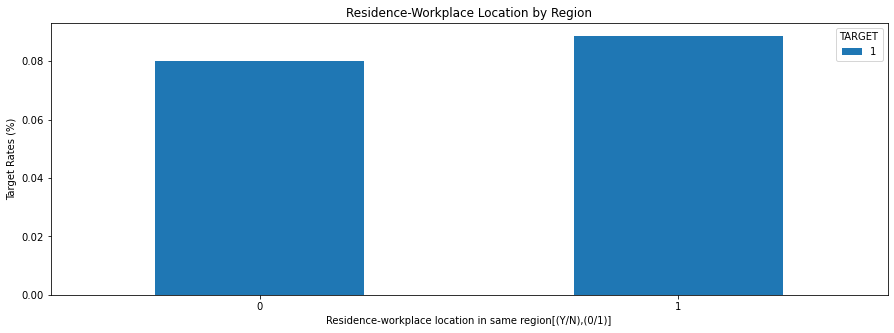

In [71]:
# figure
ax = target_by_livework_region.plot(
    kind='bar',
    grid= False,
    figsize=(15, 5),
    title='Residence-Workplace Location by Region'
)

ax.set_xlabel("Residence-workplace location in same region[(Y/N),(0/1)]")
ax.set_ylabel('Target Rates (%)')
plt.xticks(rotation = 0)

plt.show()


In [72]:
# live and work by region
c = pd.DataFrame(livework_df.groupby(['LIVE_CITY_NOT_WORK_CITY'])['TARGET'].value_counts()/livework_df.groupby(['LIVE_CITY_NOT_WORK_CITY'])['TARGET'].count())
c.columns = ['Per_Target']

target_by_livework_city = pd.pivot_table(c, values ='Per_Target', index =['LIVE_CITY_NOT_WORK_CITY'], 
                         columns =['TARGET'], aggfunc = np.sum) 
target_by_livework_city.drop(0, axis = 1, inplace = True)
target_by_livework_city.head()

TARGET,1
LIVE_CITY_NOT_WORK_CITY,
0,0.08
1,0.10


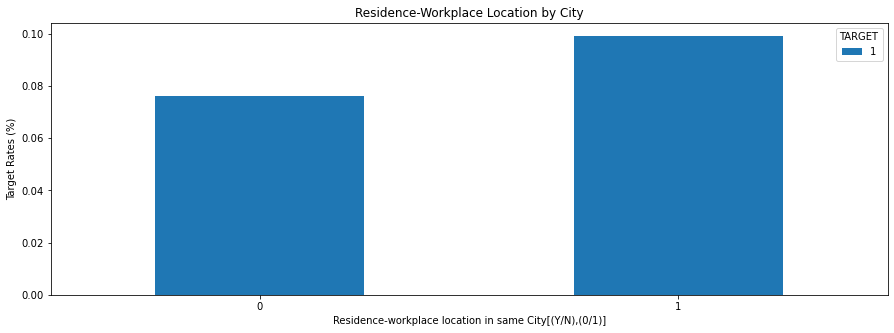

In [73]:
# figure
ax = target_by_livework_city.plot(
    kind='bar',
    grid= False,
    figsize=(15, 5),
    title='Residence-Workplace Location by City'
)

ax.set_xlabel("Residence-workplace location in same City[(Y/N),(0/1)]")
ax.set_ylabel('Target Rates (%)')
plt.xticks(rotation = 0)

plt.show()

Most of the applicants live and work in the same city/region. And applicants who doesn't live and work in the same city/region has the higher chances of default.

## Univariate analysis on continuous columns

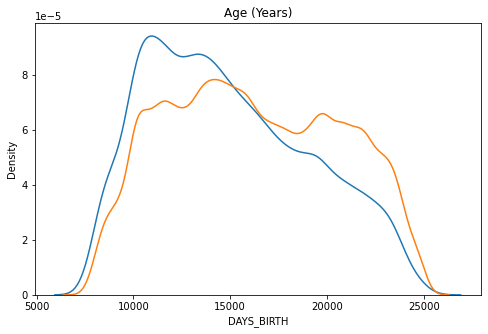

In [74]:
#plotting kde plot of 'DAYS_BIRTH'
plt.figure(figsize = (8,5))
sns.kdeplot(app_target_default['DAYS_BIRTH'], label = 'default')
sns.kdeplot(app_target_nondefault['DAYS_BIRTH'], label = 'non-default')
plt.title(r'Age (Years)')
plt.show()

Around 29 years to 40 years people are more defaulters. There is high chance to be defaulted of the young people. Non-defaulted people are almost equally distributed.

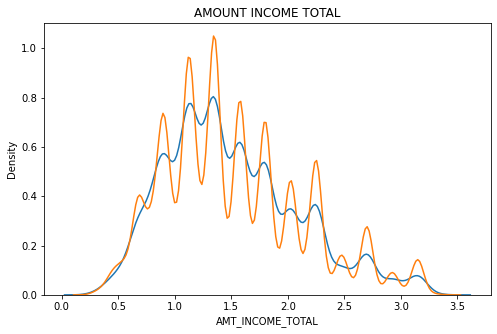

In [75]:
#plotting kde plot of 'AMT_INCOME_TOTAL'
plt.figure(figsize = (8,5))
sns.kdeplot(app_target_default['AMT_INCOME_TOTAL'], label = 'default')
sns.kdeplot(app_target_nondefault['AMT_INCOME_TOTAL'], label = 'non-default')
plt.title('AMOUNT INCOME TOTAL')
plt.show()

There are interesting patterns in both the default and non-default people with respect to Income Total. From 75000 to 200000 income has some spikes and then higher the income, the lesser spike we can see for default people. However, the pattern is same for both the default and non-default. The frequency range of non-default people is larger than default.

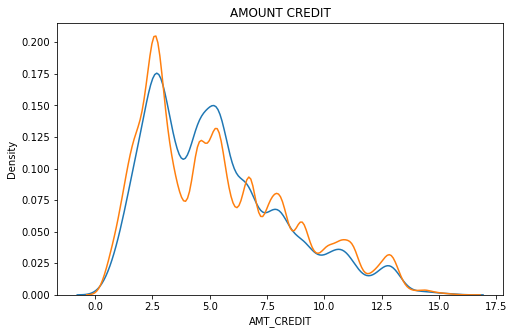

In [76]:
#plotting kde plot of 'AMT_CREDIT'
plt.figure(figsize = (8,5))
sns.kdeplot(app_target_default['AMT_CREDIT'], label = 'default')
sns.kdeplot(app_target_nondefault['AMT_CREDIT'], label = 'non-default')
plt.title('AMOUNT CREDIT')
plt.show()

Here, we can see that the lesser loan credit amount, the higher the default chances. We can do bivariate analysis with Occupation Type to find out more insight.

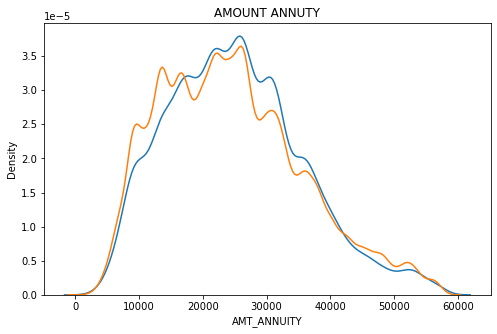

In [77]:
#plotting kde plot of 'AMT_ANNUITY'
plt.figure(figsize = (8,5))
sns.kdeplot(app_target_default['AMT_ANNUITY'], label = 'default')
sns.kdeplot(app_target_nondefault['AMT_ANNUITY'], label = 'non-default')
plt.title('AMOUNT ANNUTY')
plt.show()

Here also we can see the same pattern in both the default and non-default. The loan annuty is mostly concentrated within 10000 to 40000 range in both the cases.

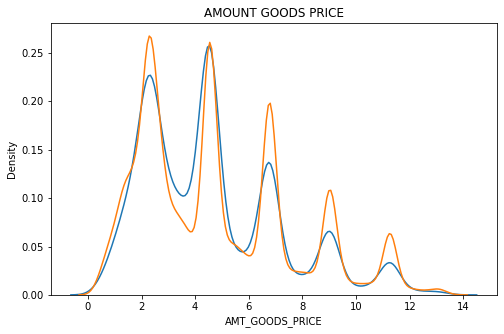

In [78]:
#plotting kde plot of 'AMT_GOODS_PRICE'
plt.figure(figsize = (8,5))
sns.kdeplot(app_target_default['AMT_GOODS_PRICE'], label = 'default')
sns.kdeplot(app_target_nondefault['AMT_GOODS_PRICE'], label = 'non-default')
plt.title('AMOUNT GOODS PRICE')
plt.show()

Here also we can see an interesting pattern. Both the curves are following the similar frequency distribution. We can see some spikes from 150000 to 220000, then around 500000 price. At this range people are more defaulted and higher the goods price, people are becoming the less defaulted. We can infer that, rich people are buying costly product and thus they are becoming less defaulted.

# Segmented univariate analysis

1.Age and Income Category Segmented two variables

In [79]:
# target by days birth
c = pd.DataFrame(application_df.groupby(['AGE_GROUP','AMT_INCOME_RANGE'])['TARGET'].value_counts()/application_df.groupby(['AGE_GROUP','AMT_INCOME_RANGE'])['TARGET'].count())
c.columns = ['Per_Target']

target_by_ageinc = pd.pivot_table(c, values ='Per_Target', index =['AGE_GROUP','AMT_INCOME_RANGE'], 
                         columns =['TARGET'], aggfunc = np.sum) 
#target_by_creditinc = target_by_creditinc.sort_values([0])
# resetting index 
target_by_ageinc.drop(0, axis = 1, inplace = True)

target_by_ageinc1 = pd.pivot_table(target_by_ageinc, values = 1, index =['AMT_INCOME_RANGE'], 
                         columns =['AGE_GROUP'], aggfunc = np.sum) 

target_by_ageinc1

AGE_GROUP,0-20,20-25,25-30,30-35,35-40,40-45,45-50,50-55,55-60,60 Above
AMT_INCOME_RANGE,,,,,,,,,,
1L-2L,0.00,0.13,0.11,0.10,0.09,0.08,0.07,0.06,0.05,0.05
0-1L,NaN,0.12,0.12,0.11,0.09,0.08,0.07,0.06,0.05,0.04
2L-3L,NaN,0.09,0.10,0.08,0.08,0.07,0.07,0.07,0.06,0.05
3L-4L,NaN,0.07,0.07,0.08,0.09,0.07,0.07,0.05,0.03,0.03


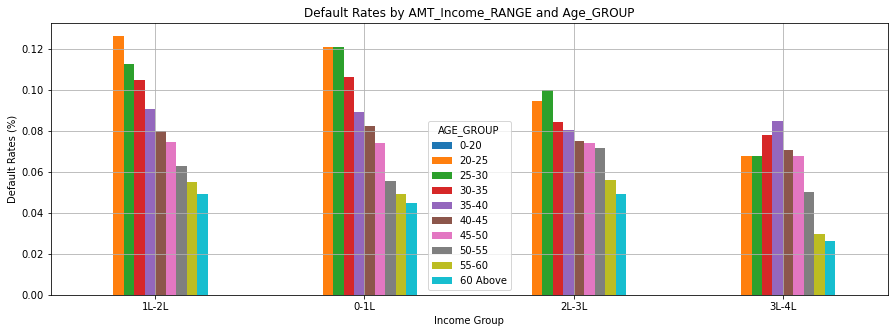

In [80]:
# figure
ax = target_by_ageinc1.plot(
    kind='bar',
    grid=True,
    figsize=(15, 5),
    title='Default Rates by AMT_Income_RANGE and Age_GROUP'
)

ax.set_xlabel("Income Group")
ax.set_ylabel('Default Rates (%)')
plt.xticks(rotation = 0)

plt.show()

We see from the above diagram that irrespective of the income groups, the chances of default decreases as the age of the applicants increases.

 2.Income and Credit amount category two segmented

In [81]:
# target
c = pd.DataFrame(application_df.groupby(['AMT_INCOME_RANGE','AMT_CREDIT'])['TARGET'].value_counts()/application_df.groupby(['AMT_INCOME_RANGE','AMT_CREDIT'])['TARGET'].count())
c.columns = ['Per_Target']

target_by_creditinc = pd.pivot_table(c, values ='Per_Target', index =['AMT_INCOME_RANGE','AMT_CREDIT'], 
                         columns =['TARGET'], aggfunc = np.sum) 
#target_by_creditinc = target_by_creditinc.sort_values([0])
# resetting index 
target_by_creditinc.drop(0, axis = 1, inplace = True)

target_by_creditinc1 = pd.pivot_table(target_by_creditinc, values = 1, index =['AMT_INCOME_RANGE'], 
                         columns =['AMT_CREDIT'], aggfunc = np.sum) 

target_by_creditinc1

AMT_CREDIT        0.45   0.48   0.49   0.49   0.49   0.50   0.51   0.52   \
AMT_INCOME_RANGE                                                           
0-1L               0.04   0.03    NaN   0.08   0.00   0.00   0.05   0.00   
1L-2L              0.05   0.03   0.00   0.00   0.00   0.07   0.04   0.02   
2L-3L              0.12   0.00    NaN    NaN   0.00   0.00   0.15   0.00   
3L-4L              0.00    NaN    NaN    NaN    NaN    NaN   0.00   0.00   

AMT_CREDIT        0.53   0.54   0.54   0.54   0.55   0.55   0.55   0.55   \
AMT_INCOME_RANGE                                                           
0-1L               0.00   0.21   0.05   0.00   0.00   0.00   0.00   0.00   
1L-2L              0.00   0.00   0.05    NaN    NaN   0.00    NaN    NaN   
2L-3L              0.00   1.00    NaN    NaN    NaN    NaN    NaN    NaN   
3L-4L               NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   

AMT_CREDIT        0.56   0.56   0.57   0.57   0.58   0.58   0.59   0.59   \
AMT_INCOME_RANGE                                                           
0-1L               0.00   0.00   0.05   0.00   0.06   0.07   0.00   0.33   
1L-2L              0.00   0.04   0.00   0.00   0.00   0.10   0.00   0.00   
2L-3L               NaN   0.00    NaN   0.00   0.00   0.00   0.00    NaN   
3L-4L               NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   

AMT_CREDIT        0.59   0.60   0.61   0.61   0.61   0.62   0.63   0.63   \
AMT_INCOME_RANGE                                                           
0-1L                NaN   0.00   0.00   0.00   0.00   0.00   0.08   0.00   
1L-2L              0.33   0.00   0.04   0.00    NaN   0.00   0.06   0.17   
2L-3L               NaN    NaN   0.00    NaN    NaN   0.33   1.00    NaN   
3L-4L               NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   

AMT_CREDIT        0.63   0.63   0.64   0.65   0.65   0.65   0.65   0.66   \
AMT_INCOME_RANGE                                                           
0-1L               0.00   0.00   0.00   0.00   0.00    NaN    NaN   0.09   
1L-2L              0.11   0.00   0.00   0.00   0.20   0.00   0.00   0.03   
2L-3L               NaN   0.00    NaN    NaN    NaN    NaN    NaN   0.00   
3L-4L               NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   

AMT_CREDIT        0.66   0.67   0.67   0.68   0.68   0.68   0.69   0.69   \
AMT_INCOME_RANGE                                                           
0-1L               0.00   0.00   0.00   0.06   0.00   0.12   0.00   1.00   
1L-2L              0.00   1.00   0.00   0.06   0.00   0.00   0.00   0.00   
2L-3L               NaN    NaN    NaN   0.10   0.00   0.00    NaN    NaN   
3L-4L               NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   

AMT_CREDIT        0.70   0.71   0.71   0.71   0.72   0.72   0.72   0.73   \
AMT_INCOME_RANGE                                                           
0-1L               0.12   0.00   0.00   0.14   0.02   0.06   0.00   0.00   
1L-2L              0.20    NaN   0.00   0.00   0.02   0.07   0.33   0.00   
2L-3L               NaN    NaN   0.00   0.00   0.00    NaN    NaN    NaN   
3L-4L               NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   

AMT_CREDIT        0.74   0.74   0.75   0.75   0.75   0.76   0.76   0.76   \
AMT_INCOME_RANGE                                                           
0-1L               0.17   0.10   0.07   0.00   0.00   0.00   0.00   0.03   
1L-2L              0.00   0.07   0.06   0.33   0.00   0.00    NaN   0.01   
2L-3L               NaN    NaN   0.00    NaN    NaN   0.00    NaN   0.09   
3L-4L               NaN    NaN    NaN    NaN    NaN    NaN    NaN   0.00   

AMT_CREDIT        0.77   0.77   0.77   0.78   0.78   0.78   0.79   0.79   \
AMT_INCOME_RANGE                                                           
0-1L               0.11   0.00   0.00    NaN   0.00   0.08   0.00   0.00   
1L-2L              0.17   0.00   0.14   0.00    NaN   0.04    NaN   0.00   
2L-3L              0.00   0.00    NaN   

In [82]:
# figure
ax = target_by_creditinc1.plot(
    kind='bar',
    grid=True,
    figsize=(15, 5),
    title='Default Rates by AMT_INCOME_RANGE and Credit Amount Category'
)

ax.set_xlabel("Income Group")
ax.set_ylabel('Default Rates (%)')
plt.xticks(rotation = 0)

plt.show()

From the above plot, we find that irrespective of the income group, the chances of default increases as the credit amount increases. Also if we compare credit amount categories by different income groups, then the default rates for all the three credit amount categories are lower in the high income group relative to the medium and low income groups.

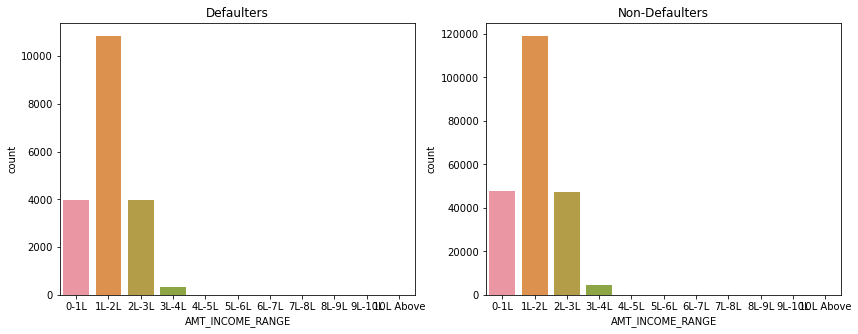

In [83]:
#plotting count plot on INCOME CATEGORY segments for both the default and non-default
plt.figure(figsize=(14,5))

plt.subplot(1,2,1)    
ax = sns.countplot(x = 'AMT_INCOME_RANGE',data=app_target_default)
plt.title('Defaulters')

plt.subplot(1,2,2) 
ax = sns.countplot(x = 'AMT_INCOME_RANGE',data=app_target_nondefault)
plt.title('Non-Defaulters')
plt.show()

ANALYSIS-
Low income group has more defaulter followed by high income group.

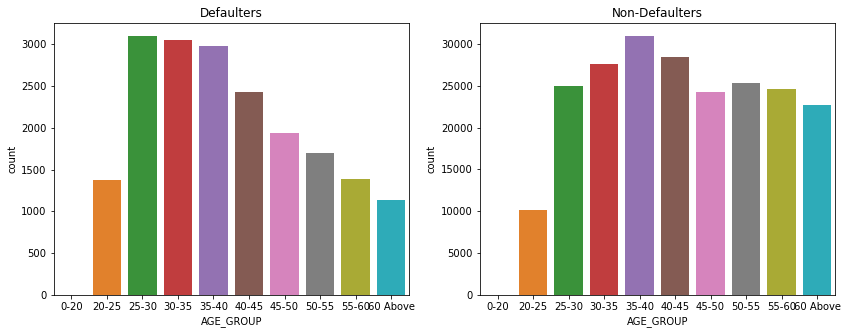

In [84]:
#plotting count plot on AGE_CATEGORY segments for both the default and non-default
plt.figure(figsize=(14,5))

plt.subplot(1,2,1)    
ax = sns.countplot(x = 'AGE_GROUP',data=app_target_default)
plt.title('Defaulters')

plt.subplot(1,2,2) 
ax = sns.countplot(x = 'AGE_GROUP',data=app_target_nondefault)
plt.title('Non-Defaulters')
plt.show()

ANALYSIS-
Mid age (35-55) age group of people are more likely to be defaulted followed by the young people.

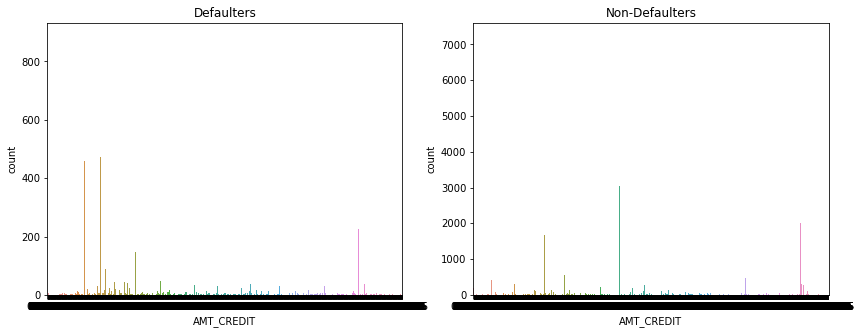

In [85]:
#plotting count plot on AMT_CREDIT segments for both the default and non-default
plt.figure(figsize=(14,5))

plt.subplot(1,2,1)    
ax = sns.countplot(x = 'AMT_CREDIT',data=app_target_default)
plt.title('Defaulters')

plt.subplot(1,2,2) 
ax = sns.countplot(x = 'AMT_CREDIT',data=app_target_nondefault)
plt.title('Non-Defaulters')
plt.show()

ANALYSIS_
Low category of loan amount credited people are more likely to be defaulted than high amount loan credit.

Education Status Vs Gender wise defaulters

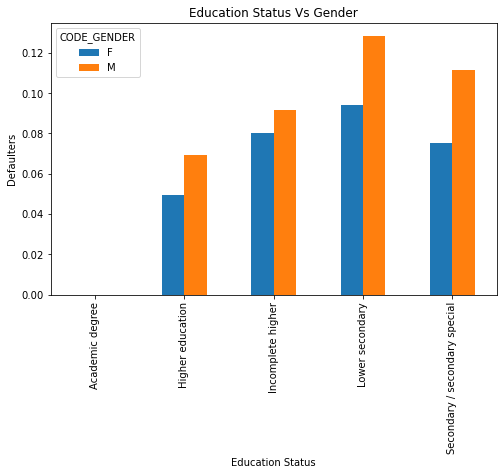

In [86]:
application_df.pivot_table(values='TARGET',index='NAME_EDUCATION_TYPE',columns='CODE_GENDER',aggfunc='mean').plot.bar(figsize=(8,5))
plt.xlabel('Education Status')
plt.ylabel('Defaulters')
plt.title('Education Status Vs Gender')
plt.show()

ANALYSIS-
Male with lower secondary education are more defaulted followed by Secondary/secondary special education.

Age Group Vs Gender

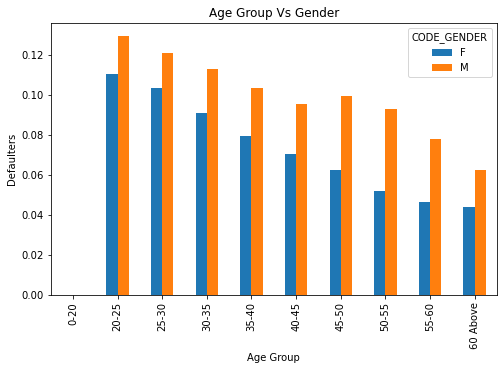

In [87]:
application_df.pivot_table(values='TARGET',index='AGE_GROUP',columns='CODE_GENDER',aggfunc='mean').plot.bar(figsize=(8,5))
plt.xlabel('Age Group')
plt.ylabel('Defaulters')
plt.title('Age Group Vs Gender')
plt.show()

ANALYSIS-
Young male clients are more in number to be defaulted.

## Bivariate analysis

1.Correlation of the continuous variables of Defaulter data frame

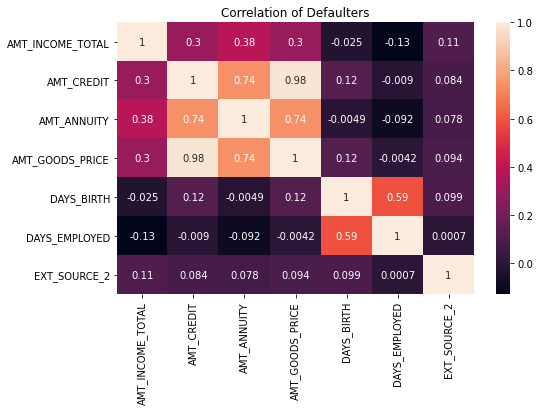

In [88]:
# plotting heatmap where TARGET = 1
cols = ['AMT_INCOME_TOTAL','AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
              'EXT_SOURCE_2']
cor = app_target_default[cols].corr()
plt.figure(figsize = (8,5))
sns.heatmap(cor, annot = True)
plt.title('Correlation of Defaulters')
plt.show()

Analysis:
We can see that GOODS_PRICE and AMT_CREDIT, AMT_ANNUTY and AMT_AMT_CREDIT are highly correlated. External Rating is highly correlated with all DAYS_BIRTH(Age), GOODS_PRICE, AMT_CREDIT.

2.Correlation of the continuous variables of Non-Defaulter data frame

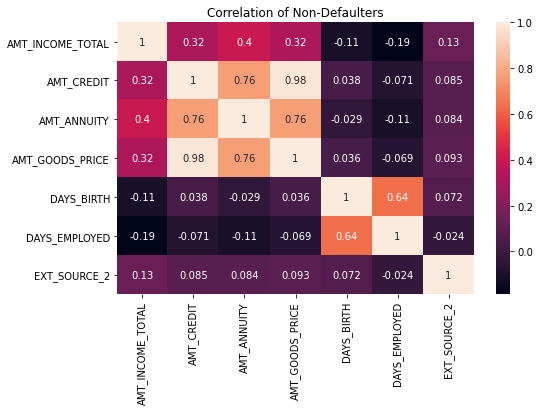

In [89]:
# plotting heatmap where TARGET = 0
cols = ['AMT_INCOME_TOTAL','AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
              'EXT_SOURCE_2']
cor = app_target_nondefault[cols].corr()
plt.figure(figsize = (8,5))
sns.heatmap(cor, annot = True)
plt.title('Correlation of Non-Defaulters')
plt.show()

Analysis:
We can see that GOODS_PRICE and AMT_CREDIT, AMT_ANNUTY and AMT_AMT_CREDIT are moderately correlated with each other. External Rating is highly correlated with all DAYS_BIRTH(Age), GOODS_PRICE, AMT_CREDIT.

## Bivariate analysis on continuous columns

1.Age and Income

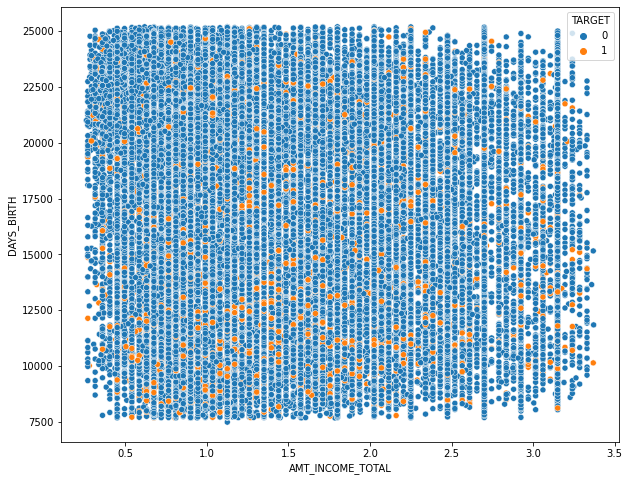

In [90]:
#plotting for AGE and INCOME TOTAL
plt.figure(figsize = (10,8))
sns.scatterplot('AMT_INCOME_TOTAL', 'DAYS_BIRTH', hue='TARGET', data = application_df)
plt.show()

ANALYSIS-
From the above figure, we see that the number of default applications are concentrated more when the days of birth i.e. age is lower, irrespective of the income.

 2.Loan Credit amount and Rating

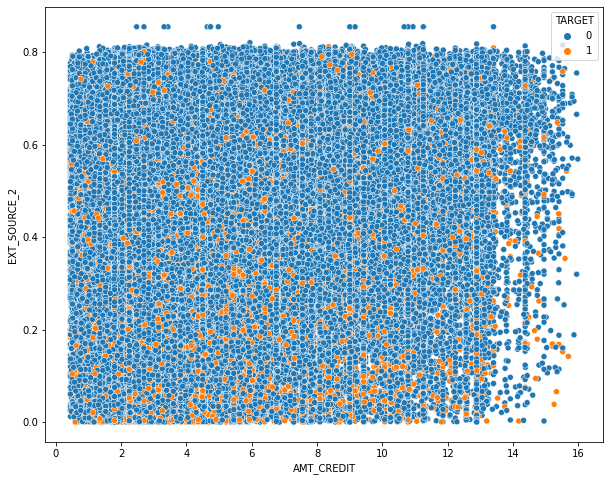

In [91]:
#plotting for CREDIT and EXT Rating
plt.figure(figsize = (10,8))
sns.scatterplot('AMT_CREDIT', 'EXT_SOURCE_2', hue='TARGET', data = application_df)
plt.show()

ANALYSIS-
From the above plot, we cannot get much insight as the data is scattered across the plot. However, we can see some concentration of defaulters near the low rating region between 0.0 to 3.0.

3.Loan Credit amount and Total Income

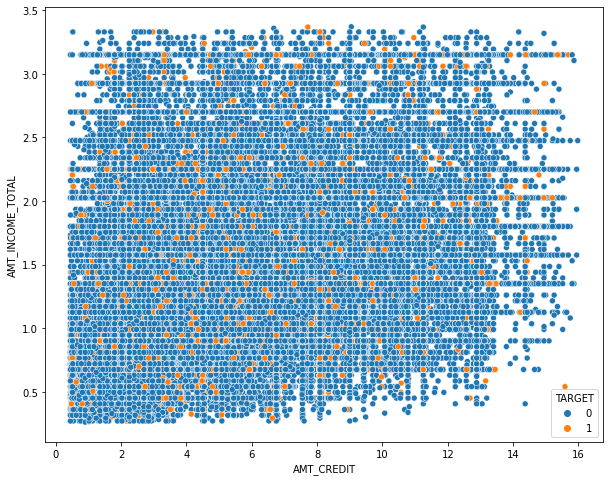

In [92]:
#plotting for CREDIT and EXT Rating
plt.figure(figsize = (10,8))
sns.scatterplot('AMT_CREDIT', 'AMT_INCOME_TOTAL', hue='TARGET', data = application_df)
plt.show()

ANALYSIS-
Here also, we can hardly find any interesting pattern.

## Bivariate analysis on categorical columns

In [93]:
categories = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'AMT_INCOME_RANGE', 
               'AGE_GROUP']

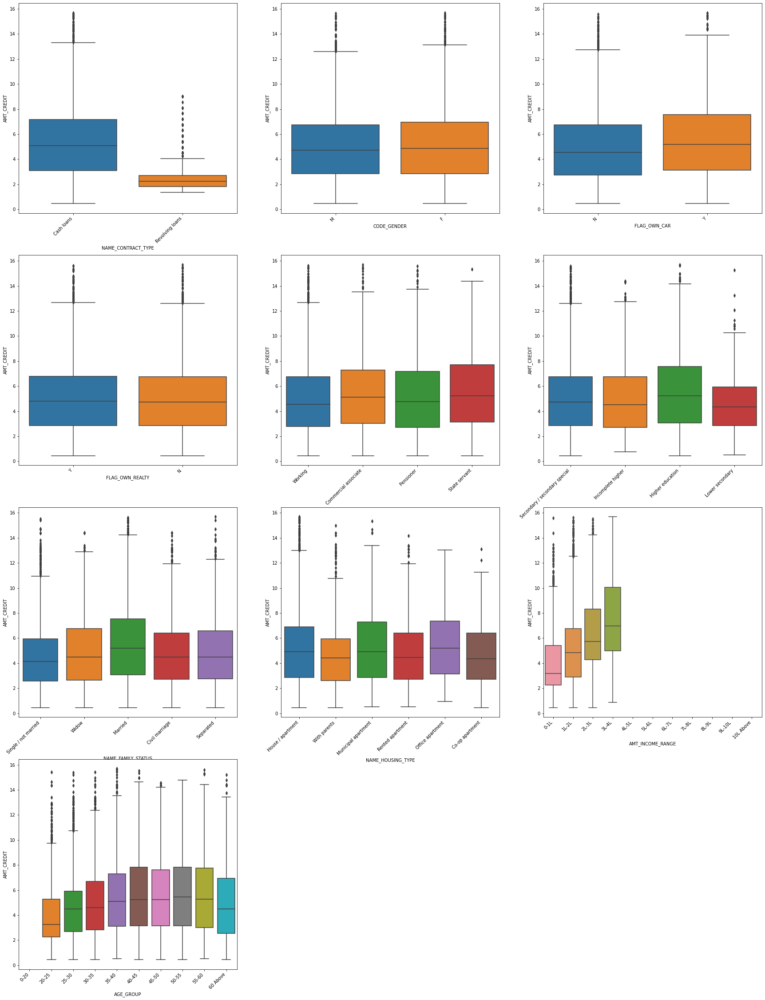

In [94]:
# plotting for Defaulters
plt.figure(figsize=(30,40))

for i, category in enumerate(categories):
    ax = plt.subplot(4,3,i+1)
    sns.boxplot(x = category, y = 'AMT_CREDIT', data=app_target_default)
    temp = ax.set_xticklabels(ax.get_xticklabels(), rotation = 45, horizontalalignment='right')

ANALYSIS-
1.Cash loans are more credited.
2.Those who are female and own car they got little more number of loans
3.State servent got more number of loans
4.Higher education got more loans
5.Married people got more number of loans
6.Clients who are living in municipal apartment, got more number of loans
7.High income group people got more loans.

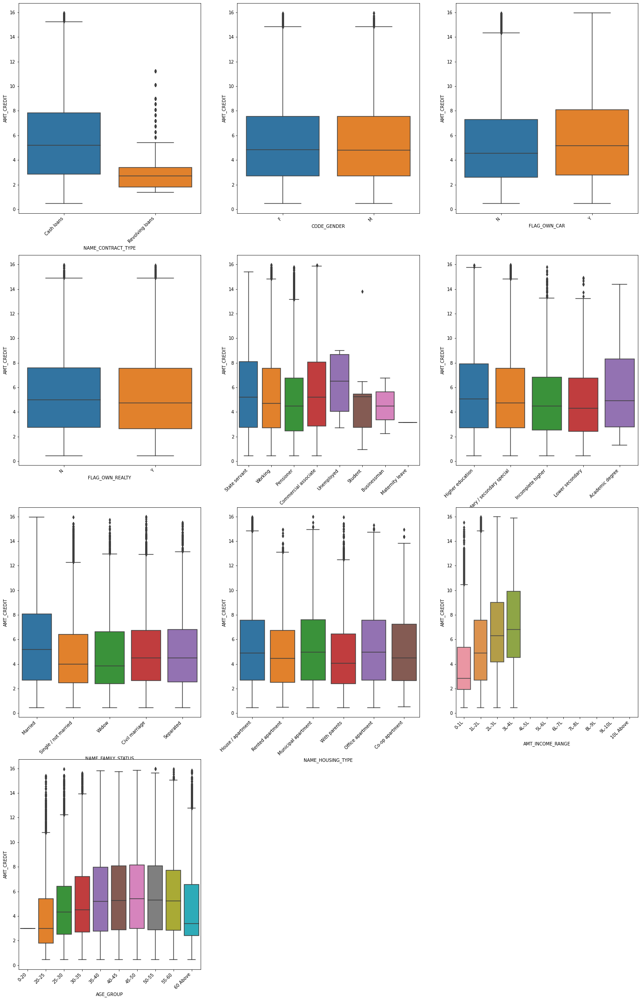

In [95]:
plt.figure(figsize=(25,40))

for i, category in enumerate(categories):
    ax = plt.subplot(4,3,i+1)
    sns.boxplot(x = category, y = 'AMT_CREDIT', data=app_target_nondefault)
    temp = ax.set_xticklabels(ax.get_xticklabels(), rotation = 45, horizontalalignment='right')

ANALYSIS-
1.Cash loans are more credited.
2.Those who are female and own car they got little more number of loans
3.State servent got more number of loans
4.Higher education got more loans
5.Married people got more number of loans
6.Clients who are living in municipal apartment, got more number of loans
7.High income group people got more loans.
8.Age Group between 45-50 got more number of loans.

## Previous Application Data

PART A: Missing Value Treatment

In [96]:
#checking for unique values in each columns
for col in prev_appli.columns:
    print(col)
    print('-----------------')
    print(prev_appli[col].unique())

SK_ID_PREV
-----------------
[2030495 2802425 2523466 ... 2659632 2785582 2418762]
SK_ID_CURR
-----------------
[271877 108129 122040 ... 253940 353284 191629]
NAME_CONTRACT_TYPE
-----------------
['Consumer loans' 'Cash loans' 'Revolving loans' 'XNA']
AMT_ANNUITY
-----------------
[ 1730.43  25188.615 15060.735 ... 15708.15   8546.94  14704.29 ]
AMT_APPLICATION
-----------------
[ 17145.   607500.   112500.   ... 332596.08 373230.72 267295.5 ]
AMT_CREDIT
-----------------
[ 17145.   679671.   136444.5  ... 977724.   626796.   436370.22]
AMT_DOWN_PAYMENT
-----------------
[    0.        nan 12649.5  ...  4099.95 55325.25 50476.5 ]
AMT_GOODS_PRICE
-----------------
[ 17145.   607500.   112500.   ... 332596.08 373230.72 267295.5 ]
WEEKDAY_APPR_PROCESS_START
-----------------
['SATURDAY' 'THURSDAY' 'TUESDAY' 'MONDAY' 'FRIDAY' 'SUNDAY' 'WEDNESDAY']
HOUR_APPR_PROCESS_START
-----------------
[15 11  7  9  8 10 12 13 14 16  6  4  5 19 17 18 20 22 21  3  1  2 23  0]
FLAG_LAST_APPL_PER_CONTRACT

There are lot of columns have 'XNA' and 'XAP' values. We are replacing these values with NaN value so that we can treat further.

In [97]:
prev_appli.replace('XNA',np.nan,inplace=True)
prev_appli.replace('XAP',np.nan,inplace=True)

In [98]:
#checking for missing value perventage columns wise
round(100*(prev_appli.isnull().sum() / len(prev_appli.index)),2)

SK_ID_PREV                     0.00
SK_ID_CURR                     0.00
NAME_CONTRACT_TYPE             0.02
AMT_ANNUITY                   22.29
AMT_APPLICATION                0.00
AMT_CREDIT                     0.00
AMT_DOWN_PAYMENT              53.64
AMT_GOODS_PRICE               23.08
WEEKDAY_APPR_PROCESS_START     0.00
HOUR_APPR_PROCESS_START        0.00
FLAG_LAST_APPL_PER_CONTRACT    0.00
NFLAG_LAST_APPL_IN_DAY         0.00
RATE_DOWN_PAYMENT             53.64
RATE_INTEREST_PRIMARY         99.64
RATE_INTEREST_PRIVILEGED      99.64
NAME_CASH_LOAN_PURPOSE        95.83
NAME_CONTRACT_STATUS           0.00
DAYS_DECISION                  0.00
NAME_PAYMENT_TYPE             37.56
CODE_REJECT_REASON            81.33
NAME_TYPE_SUITE               49.12
NAME_CLIENT_TYPE               0.12
NAME_GOODS_CATEGORY           56.93
NAME_PORTFOLIO                22.29
NAME_PRODUCT_TYPE             63.68
CHANNEL_TYPE                   0.00
SELLERPLACE_AREA               0.00
NAME_SELLER_INDUSTRY        

Treating missing values by dropping columns more than 30% missing values

In [99]:
#dropping all the columns which has missing value more than 30%
previous_df = prev_appli.drop(prev_appli.columns[prev_appli.isnull().mean() >= 0.3], axis = 1)

In [100]:
# dropping columns which are not significant for the analysis.
cols_to_be_deleted = ['WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START','FLAG_LAST_APPL_PER_CONTRACT', 
                      'NFLAG_LAST_APPL_IN_DAY','SELLERPLACE_AREA','PRODUCT_COMBINATION']

previous_df = previous_df.drop(cols_to_be_deleted, axis = 1)

Removing missing values AMT_ANNUITY, AMT_GOODS_PRICE, CNT_PAYMENT row wise

In [101]:
#checking number of rows have where AMT_ANNUITY, AMT_GOODS_PRICE and CNT_PAYMENT all have missing values
print(len(previous_df[np.isnan(previous_df['AMT_ANNUITY']) & np.isnan(previous_df['AMT_GOODS_PRICE']) & np.isnan(previous_df['CNT_PAYMENT'])].index))

333855


In [102]:
#removing the rows where AMT_ANNUITY, AMT_GOODS_PRICE and CNT_PAYMENT all have missing values as the number of rows are not very 
#large compare to the original data frame
previous_df = previous_df[~(np.isnan(previous_df['AMT_ANNUITY']) & np.isnan(previous_df['AMT_GOODS_PRICE']) & np.isnan(previous_df['CNT_PAYMENT']))]
previous_df.shape

(1336359, 13)

In [103]:
#checking for missing value percentage columns wise after removing the rows
round(100*(previous_df.isnull().sum() / len(previous_df.index)),2)

SK_ID_PREV             0.00
SK_ID_CURR             0.00
NAME_CONTRACT_TYPE     0.00
AMT_ANNUITY            2.87
AMT_APPLICATION        0.00
AMT_CREDIT             0.00
AMT_GOODS_PRICE        3.87
NAME_CONTRACT_STATUS   0.00
DAYS_DECISION          0.00
NAME_CLIENT_TYPE       0.07
NAME_PORTFOLIO         2.87
CHANNEL_TYPE           0.00
CNT_PAYMENT            2.87
dtype: float64

In [104]:
round(previous_df[['AMT_ANNUITY', 'AMT_GOODS_PRICE', 'CNT_PAYMENT']].describe(percentiles = [0.05, 0.25, 0.5, 0.75, 0.9, 0.95, .99]),2)

,AMT_ANNUITY,AMT_GOODS_PRICE,CNT_PAYMENT
count,1297979.00,1284699.00,1297984.00
mean,15955.12,227847.28,16.05
std,14782.14,315396.56,14.57
min,0.00,0.00,0.00
5%,2726.60,22882.50,0.00
25%,6321.78,50841.00,6.00
50%,11250.00,112320.00,12.00
75%,20658.42,234000.00,24.00
90%,34703.82,585000.00,36.00
95%,45336.78,900000.00,48.00


We can see there are outliers are present in these columns

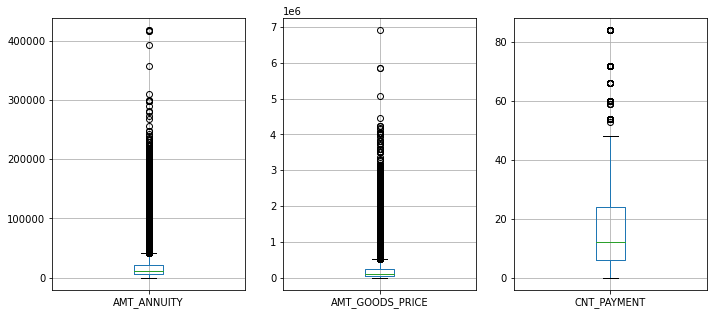

In [105]:
cols = ['AMT_ANNUITY', 'AMT_GOODS_PRICE', 'CNT_PAYMENT']
plt.figure(figsize=(20,5))
for i, col in enumerate(cols):
    plt.subplot(1,5, i+1)
    previous_df.boxplot(column = col)
plt.show()

Removing outliers useing 1.5 IQR method

In [106]:
# removing outliers using 1.5 IQR method
for col in cols: 
    q1 = previous_df[col].quantile(0.25)
    q3 = previous_df[col].quantile(0.75)
    iqr = q3-q1
    range_low  = q1-1.5*iqr
    range_high = q3+1.5*iqr
    previous_df = previous_df.loc[(previous_df[col] > range_low) & (previous_df[col] < range_high)]

In [107]:
# percentage data lost 
100 * ((prev_appli.shape[0] - previous_df.shape[0]) / prev_appli.shape[0])

40.129827674777005

Around 40% data we have lost after this operation

In [108]:
round(100*(previous_df.isnull().sum() / len(previous_df.index)),2)

SK_ID_PREV             0.00
SK_ID_CURR             0.00
NAME_CONTRACT_TYPE     0.00
AMT_ANNUITY            0.00
AMT_APPLICATION        0.00
AMT_CREDIT             0.00
AMT_GOODS_PRICE        0.00
NAME_CONTRACT_STATUS   0.00
DAYS_DECISION          0.00
NAME_CLIENT_TYPE       0.06
NAME_PORTFOLIO         0.00
CHANNEL_TYPE           0.00
CNT_PAYMENT            0.00
dtype: float64

After removing outliers, we have only 0.06% missing value present in the data frame for NAME_CLIENT_TYPE. We are not treating these missing values.

In [109]:
# converting all DAYS columns to month columns
previous_df['DAYS_DECISION'] = abs(previous_df['DAYS_DECISION'] // 30)

In [110]:
previous_df.dtypes

SK_ID_PREV                int64
SK_ID_CURR                int64
NAME_CONTRACT_TYPE       object
AMT_ANNUITY             float64
AMT_APPLICATION         float64
AMT_CREDIT              float64
AMT_GOODS_PRICE         float64
NAME_CONTRACT_STATUS     object
DAYS_DECISION             int64
NAME_CLIENT_TYPE         object
NAME_PORTFOLIO           object
CHANNEL_TYPE             object
CNT_PAYMENT             float64
dtype: object

In [111]:
# selecting columns from the application data frame to merge
cols = ['SK_ID_CURR','TARGET','CODE_GENDER','NAME_EDUCATION_TYPE','NAME_FAMILY_STATUS','AMT_INCOME_RANGE','AGE_GROUP','AMT_CREDIT', 'DAYS_BIRTH']
application_sub = application_df[cols]
application_sub.head()

,SK_ID_CURR,TARGET,CODE_GENDER,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,AMT_INCOME_RANGE,AGE_GROUP,AMT_CREDIT,DAYS_BIRTH
0,100002,1,M,Secondary / secondary special,Single / not married,2L-3L,20-25,4.07,9461
1,100003,0,F,Higher education,Married,2L-3L,40-45,12.94,16765
2,100004,0,M,Secondary / secondary special,Single / not married,0-1L,50-55,1.35,19046
4,100007,0,M,Secondary / secondary special,Single / not married,1L-2L,50-55,5.13,19932
5,100008,0,M,Secondary / secondary special,Married,0-1L,45-50,4.90,16941


Merging previous application data with application data for further analysis

In [112]:
# merging previous application data with the subset of the application data frame
merged = pd.merge(previous_df,application_sub, on='SK_ID_CURR', how='left')
merged.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT_x,AMT_GOODS_PRICE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_CLIENT_TYPE,NAME_PORTFOLIO,CHANNEL_TYPE,CNT_PAYMENT,TARGET,CODE_GENDER,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,AMT_INCOME_RANGE,AGE_GROUP,AMT_CREDIT_y,DAYS_BIRTH
0,2030495,271877,Consumer loans,1730.43,17145.00,17145.00,17145.00,Approved,3,Repeater,POS,Country-wide,12.00,0.00,F,Incomplete higher,Married,2L-3L,35-40,5.34,14443.00
1,2523466,122040,Cash loans,15060.74,112500.00,136444.50,112500.00,Approved,11,Repeater,Cash,Credit and cash offices,12.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1784265,202054,Cash loans,31924.40,337500.00,404055.00,337500.00,Refused,27,Repeater,Cash,Credit and cash offices,24.00,0.00,F,Secondary / secondary special,Married,1L-2L,25-30,6.28,10020.00
3,1383531,199383,Cash loans,23703.93,315000.00,340573.50,315000.00,Approved,23,Repeater,Cash,Credit and cash offices,18.00,0.00,M,Secondary / secondary special,Civil marriage,1L-2L,55-60,9.41,21092.00
4,2257824,161140,Cash loans,13832.77,211500.00,246397.50,211500.00,Approved,28,Repeater,Cash,Credit and cash offices,30.00,0.00,F,Secondary / secondary special,Separated,1L-2L,60 Above,3.38,23338.00


In [113]:
# checking for the null value column wise
merged.isnull().sum()

SK_ID_PREV                   0
SK_ID_CURR                   0
NAME_CONTRACT_TYPE           0
AMT_ANNUITY                  0
AMT_APPLICATION              0
AMT_CREDIT_x                 0
AMT_GOODS_PRICE              0
NAME_CONTRACT_STATUS         0
DAYS_DECISION                0
NAME_CLIENT_TYPE           628
NAME_PORTFOLIO               0
CHANNEL_TYPE                 0
CNT_PAYMENT                  0
TARGET                  316938
CODE_GENDER             316938
NAME_EDUCATION_TYPE     316938
NAME_FAMILY_STATUS      316938
AMT_INCOME_RANGE        316938
AGE_GROUP               316938
AMT_CREDIT_y            316938
DAYS_BIRTH              316938
dtype: int64

In [114]:
#removing the rows where TARGET column has null value due to left join
merged = merged[~np.isnan(merged['TARGET'])]

## Univariate Analysis on categorical columns

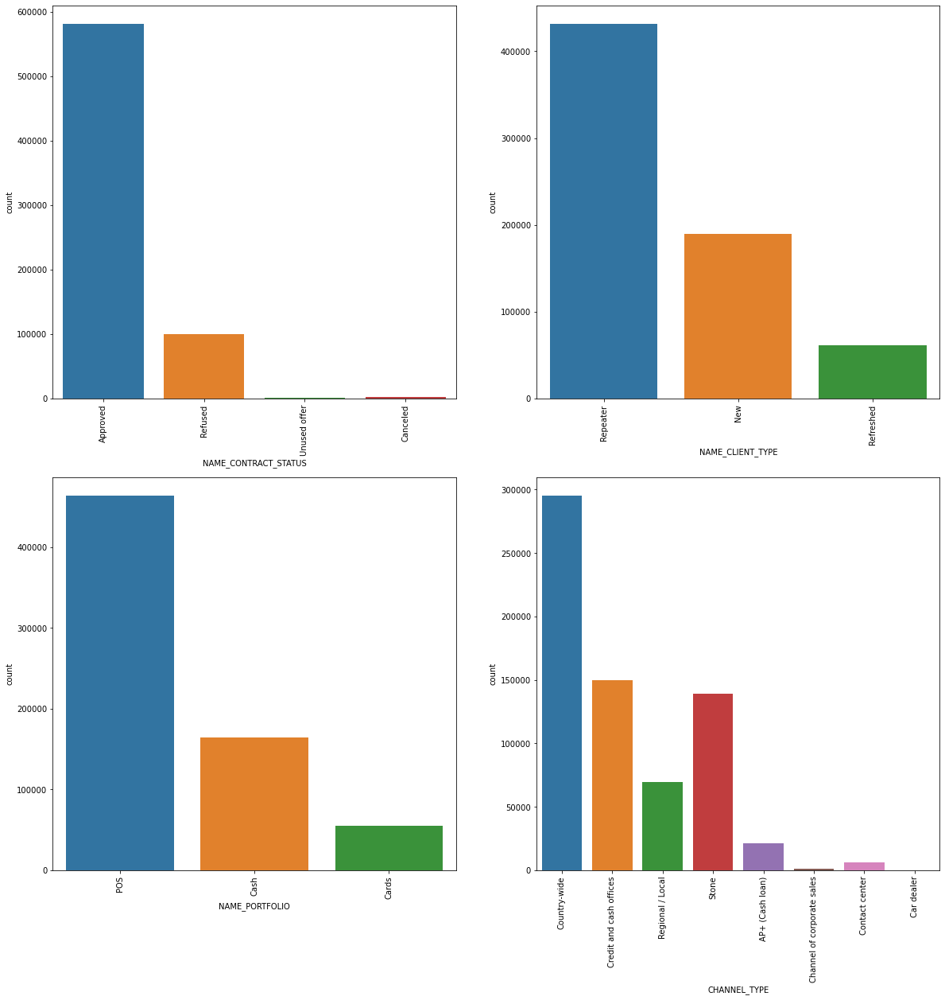

In [115]:
#plotting count plot for categorical columns
categorical = ['NAME_CONTRACT_STATUS', 'NAME_CLIENT_TYPE', 'NAME_PORTFOLIO', 'CHANNEL_TYPE']
plt.figure(figsize = (20,20))
i = 1
for col in categorical:
    plt.subplot(2,2,i)
    sns.countplot(x = col , data = merged)
    plt.xticks(rotation = 90)
    i += 1
plt.show()

ANALYSIS-
1.Approved loan status is huge than rejected or canceled.
2.Repeater clients are highest in number than new client.
3.POS loans are highest rather than cash loans.
4.Country-wide channel type is the most used channel followed by Credit and cash offers.

## Univariate analysis on continuous columns

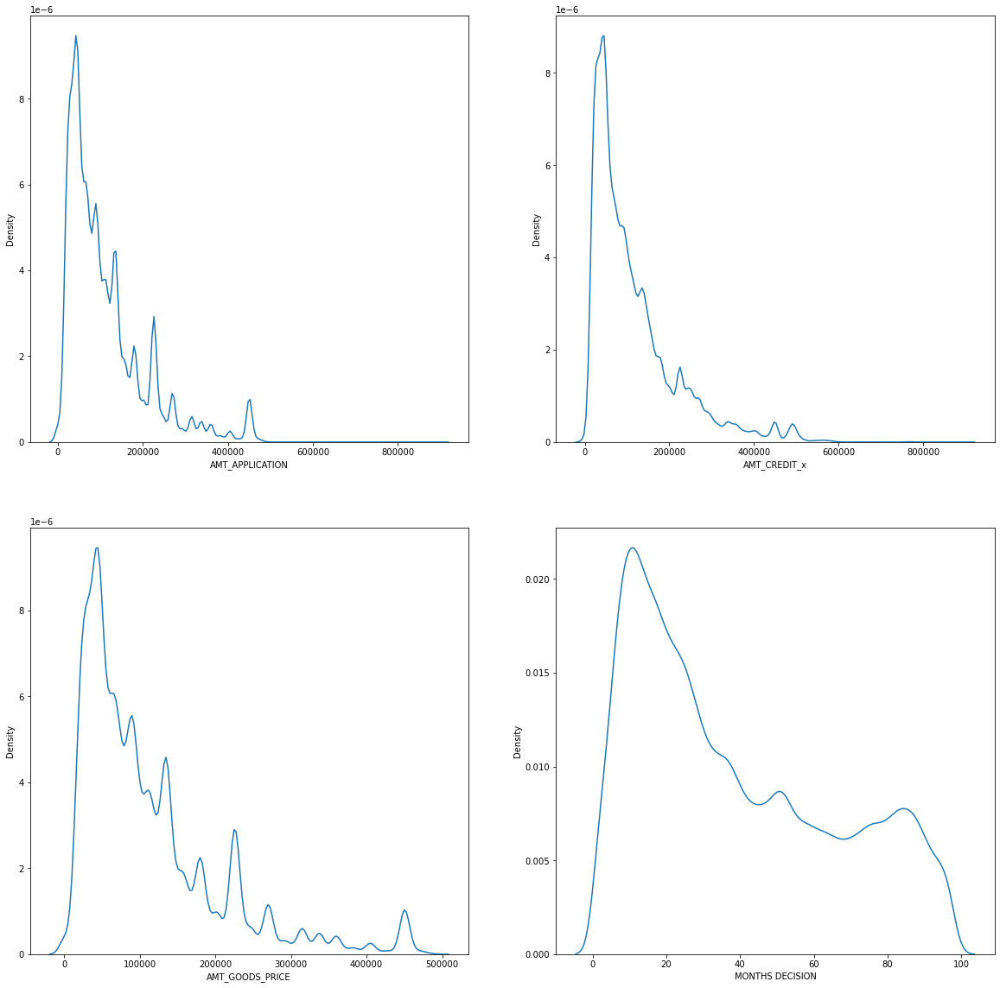

In [116]:
#plotting kde plot for categorical columns
continous = ['AMT_APPLICATION', 'AMT_CREDIT_x', 'AMT_GOODS_PRICE', 'DAYS_DECISION']

plt.figure(figsize = (20,20))
i = 1
for col in continous:
    plt.subplot(2,2,i)
    if col == 'DAYS_DECISION':
        ax = sns.kdeplot(merged[col], label = 'MONTHS DECISION')
        ax.set(xlabel = 'MONTHS DECISION')
    else:
        ax = sns.kdeplot(merged[col])
        ax.set(xlabel = col)
    i += 1
plt.show()

Analysis
1.Most of the loan application amount were below 500000, we can see a huge spike around 100000 amount.
2.Amount credited, is also following the pattern of loan application. We already saw that most of the application was approved in previous plots.
3.Amount of the goods price is also following the same distribution like application amount and amount credited. Becasue, based  on the price of the goods, the loan was approved and amount was credited.
4.Most of the applications decision took around 10 to 30 months.

## Bivariate analysis

In [117]:
subset = merged[['AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT_x', 'AMT_GOODS_PRICE', 'DAYS_DECISION', 'CNT_PAYMENT', 'DAYS_BIRTH']]

subset.head()

,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT_x,AMT_GOODS_PRICE,DAYS_DECISION,CNT_PAYMENT,DAYS_BIRTH
0,1730.43,17145.00,17145.00,17145.00,3,12.00,14443.00
2,31924.40,337500.00,404055.00,337500.00,27,24.00,10020.00
3,23703.93,315000.00,340573.50,315000.00,23,18.00,21092.00
4,13832.77,211500.00,246397.50,211500.00,28,30.00,23338.00
5,12165.21,148500.00,174361.50,148500.00,29,24.00,19945.00


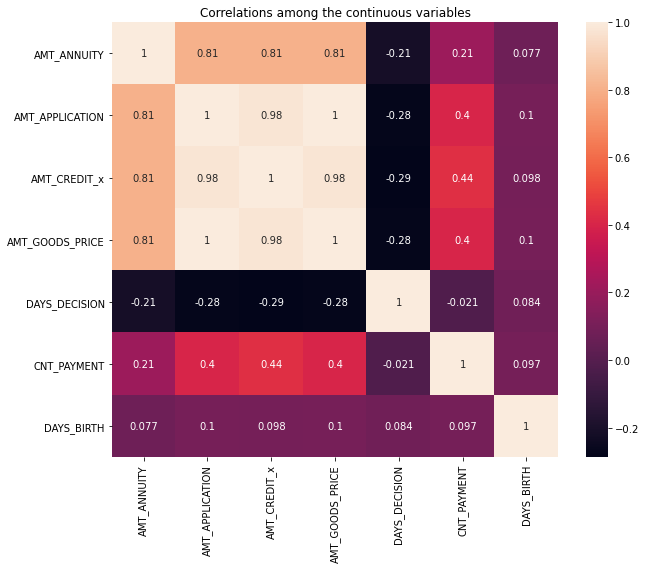

In [118]:
plt.figure(figsize = (10,8))
cor = subset.corr()
sns.heatmap(cor, annot = True)
plt.title('Correlations among the continuous variables')
plt.show()

ANALYSIS-
There are strong correlations between below variables DAYS_BIRTH(AGE) is correlated with all the variables AMT_APPLICATION is correlated with AMT_ANNUTY, AMT_AMT_CREDIT, AMT_GOODS_PRICE

Bivariate analysis on continuous columns

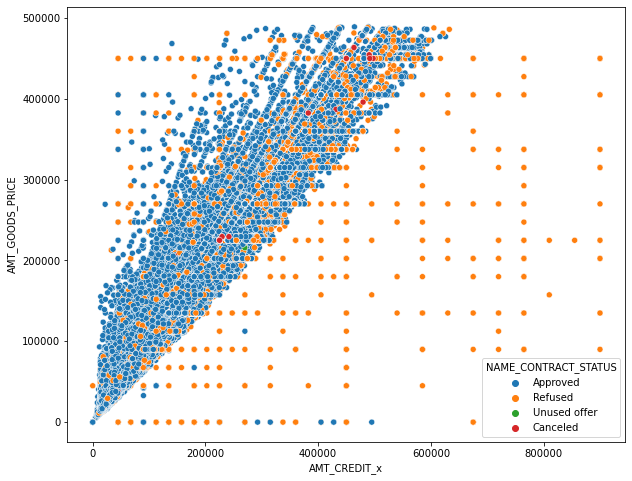

In [119]:
plt.figure(figsize = (10,8))
sns.scatterplot('AMT_CREDIT_x', 'AMT_GOODS_PRICE', hue='NAME_CONTRACT_STATUS', data = merged)
plt.show()

ANALYSIS-
AMT_GOODS_PRICE and AMT_CREDIT are posotively correlated and mostly concentrated near the lower region. High AMT_CREDIT loans are most likely to be refused.

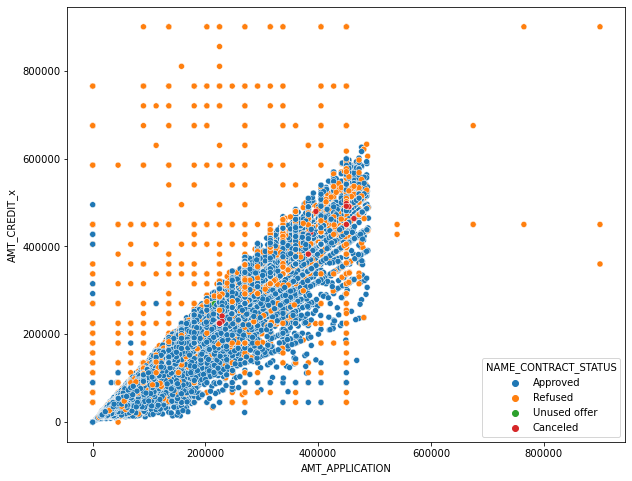

In [120]:
plt.figure(figsize = (10,8))
sns.scatterplot('AMT_APPLICATION', 'AMT_CREDIT_x', hue='NAME_CONTRACT_STATUS', data = merged)
plt.show()

ANALYSIS-
Credit amount and the application is highly correlated.

## Bivariate analysis on categorical columns

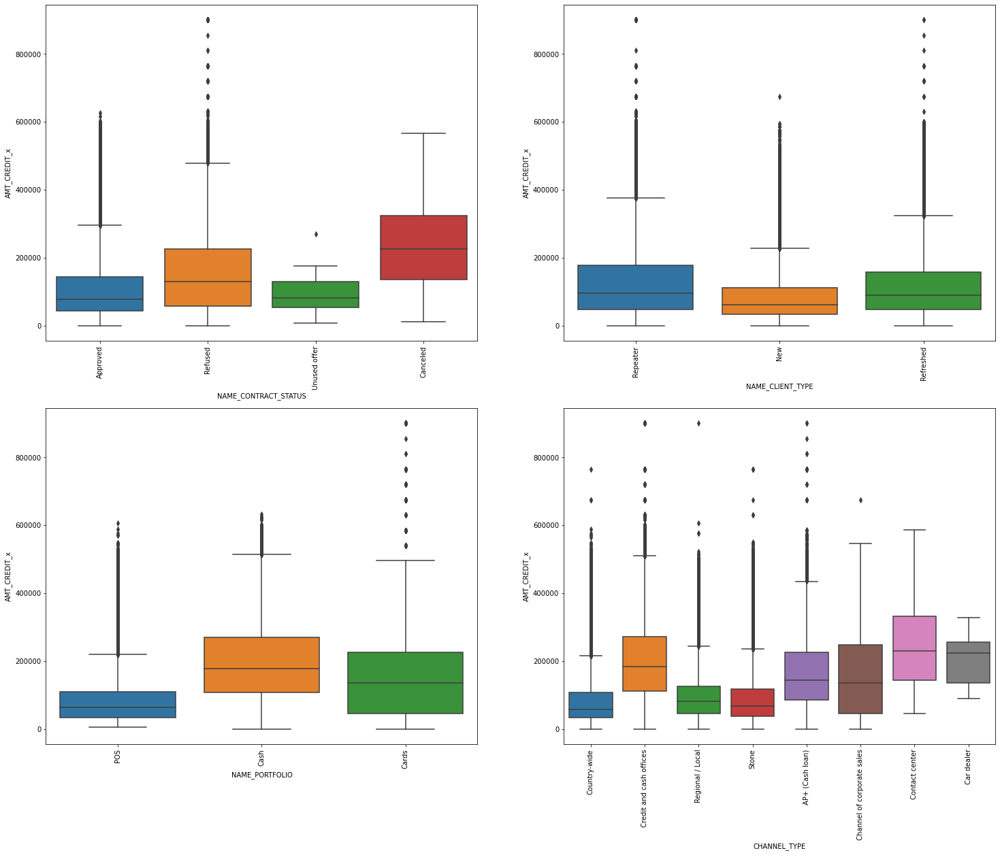

In [121]:
plt.figure(figsize=(25,20))
i=1
for category in categorical:
    ax = plt.subplot(2,2,i)
    sns.boxplot(x = category, y = 'AMT_CREDIT_x', data=merged)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
    i += 1
plt.show()

ANALYSIS-
1.Most of the amount credit was cancelled in status
2.Repeater client got more loan credit
3.Cash loan got more credited.
4.Through the contact center channel, more loan got credited.

# Segmented univariate analysis

In [122]:
print(round(application_df['AMT_GOODS_PRICE'].describe(), 3))
q50 = application_df['AMT_GOODS_PRICE'].quantile(0.5)
q75 = application_df['AMT_GOODS_PRICE'].quantile(0.75)

# creating Credit amount groups
def goodsprice_category(value):
    if value <= q50:
        return 'Low'
    elif value > q50 and value <= q75:
        return 'Medium'
    else:
        return 'High'

application_df['GOODSPRICE_CATEGORY'] = application_df['AMT_GOODS_PRICE'].apply(goodsprice_category)

count   238066.00
mean         4.77
std          2.85
min          0.41
25%          2.29
50%          4.50
75%          6.75
max         13.41
Name: AMT_GOODS_PRICE, dtype: float64


In [123]:
pd.DataFrame(application_df.groupby(['AMT_INCOME_RANGE','GOODSPRICE_CATEGORY'])['TARGET'].value_counts())

TARGET
AMT_INCOME_RANGE GOODSPRICE_CATEGORY TARGET        
0-1L             High                0         4080
                                     1          237
                 Low                 0        34725
                                     1         3058
                 Medium              0         9088
                                     1          667
1L-2L            High                0        25177
                                     1         1685
                 Low                 0        64781
                                     1         6792
                 Medium              0        29083
                                     1         2367
2L-3L            High                0        16301
                                     1         1013
                 Low                 0        18333
                                     1         1885
                 Medium              0        12766
                                     1         1063
3L-4L            High                0         1957
                                     1          131
                 Low                 0         1537
                                     1          108
                 Medium              0         1144
                                     1           88

In [124]:
# target
c = pd.DataFrame(application_df.groupby(['AMT_INCOME_RANGE','GOODSPRICE_CATEGORY'])['TARGET'].value_counts()/application_df.groupby(['AMT_INCOME_RANGE','GOODSPRICE_CATEGORY'])['TARGET'].count())
c.columns = ['Per_Target']

target_by_priceinc = pd.pivot_table(c, values ='Per_Target', index =['AMT_INCOME_RANGE','GOODSPRICE_CATEGORY'], 
                         columns =['TARGET'], aggfunc = np.sum) 
#target_by_creditinc = target_by_creditinc.sort_values([0])
# resetting index 
target_by_priceinc.drop(0, axis = 1, inplace = True)

target_by_priceinc1 = pd.pivot_table(target_by_priceinc, values = 1, index =['AMT_INCOME_RANGE'], 
                         columns =['GOODSPRICE_CATEGORY'], aggfunc = np.sum) 

target_by_priceinc1

GOODSPRICE_CATEGORY,High,Low,Medium
AMT_INCOME_RANGE,,,
0-1L,0.05,0.08,0.07
1L-2L,0.06,0.09,0.08
2L-3L,0.06,0.09,0.08
3L-4L,0.06,0.07,0.07


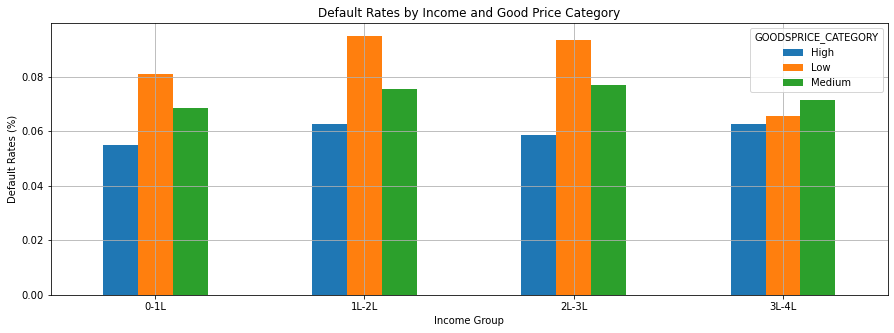

In [125]:
# figure
ax = target_by_priceinc1.plot(
    kind='bar',
    grid=True,
    figsize=(15, 5),
    title='Default Rates by Income and Good Price Category'
)

ax.set_xlabel("Income Group")
ax.set_ylabel('Default Rates (%)')
plt.xticks(rotation = 0)

plt.show()


ANALYSIS
From the above analysis, we find that irrespective of the income groups, the lowest price of the good has the highest chances of default.Interestingly, the highest price category of goods has the lowest probability of default for all the income groups.

Previous loan Status Vs Current Defaulters Plot

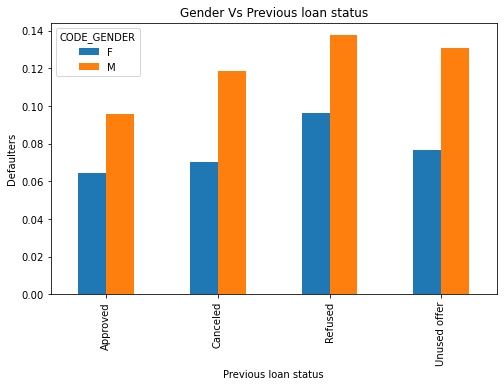

In [126]:
merged.pivot_table(values='TARGET',index='NAME_CONTRACT_STATUS',columns='CODE_GENDER',aggfunc='mean').plot.bar(figsize=(8,5))
plt.xlabel('Previous loan status')
plt.ylabel('Defaulters')
plt.title('Gender Vs Previous loan status')
plt.show()


ANALYSIS-
Male clients are more defaulted than female client. Also, previously refused customer are more defaulted in current application.

Client Type Vs Previous loan status plot

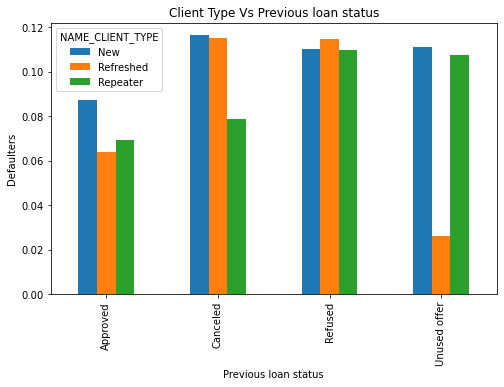

In [127]:
merged.pivot_table(values='TARGET',index='NAME_CONTRACT_STATUS',columns='NAME_CLIENT_TYPE',aggfunc='mean').plot.bar(figsize=(8,5))
plt.xlabel('Previous loan status')
plt.ylabel('Defaulters')
plt.title('Client Type Vs Previous loan status')
plt.show()


ANALYSIS-
Previously cancelled New and Refreshed clients are more defaulted than repeater clients

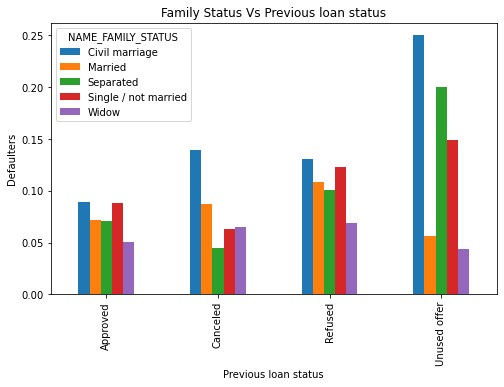

In [128]:
merged.pivot_table(values='TARGET',index='NAME_CONTRACT_STATUS',columns='NAME_FAMILY_STATUS',aggfunc='mean').plot.bar(figsize=(8,5))
plt.xlabel('Previous loan status')
plt.ylabel('Defaulters')
plt.title('Family Status Vs Previous loan status')
plt.show()

ANALYSIS-
Client who did civil marriage with previously unused loan offers are more defaulted currently.

Education status Vs Previous loan status

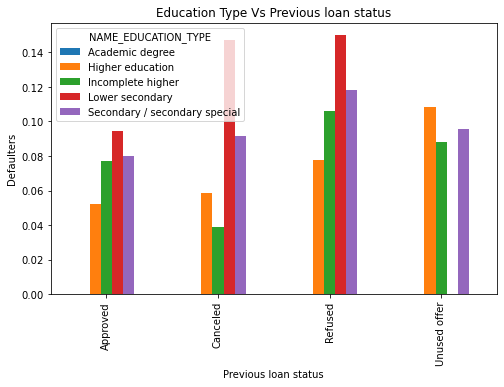

In [129]:
merged.pivot_table(values='TARGET',index='NAME_CONTRACT_STATUS',columns='NAME_EDUCATION_TYPE',aggfunc='mean').plot.bar(figsize=(8,5))
plt.xlabel('Previous loan status')
plt.ylabel('Defaulters')
plt.title('Education Type Vs Previous loan status')
plt.show()

ANALYSIS-
Previously refused people with lower secondary education are more defaulted in current application.